In [1]:
# import os

# os.environ["KERAS_BACKEND"] = "tensorflow"

# Setting random seed to obtain reproducible results.
import tensorflow as tf

tf.random.set_seed(42)

import keras
from keras import layers

import os
import glob
import imageio.v2 as imageio
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt

# Initialize global variables.
AUTO = tf.data.AUTOTUNE
BATCH_SIZE = 5
# NUM_SAMPLES = 32
POS_ENCODE_DIMS = 16
EPOCHS = 100

NUM_SAMPLES_COARSE = 64
NUM_SAMPLES_FINE_IMPORTANCE = 64

WARMUP_EPOCHS = 10

2025-05-13 02:17:56.519239: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-05-13 02:17:56.572593: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI AVX512_BF16 AVX_VNNI AMX_TILE AMX_INT8 AMX_BF16 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-05-13 02:17:57.274468: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [2]:
# Download the data if it does not already exist.
url = (
    "http://cseweb.ucsd.edu/~viscomp/projects/LF/papers/ECCV20/nerf/tiny_nerf_data.npz"
)
data = tf.keras.utils.get_file(origin=url)

data = np.load(data)
images = data["images"]
im_shape = images.shape
(num_images, H, W, _) = images.shape
(poses, focal) = (data["poses"], data["focal"])

# Plot a random image from the dataset for visualization.
# plt.imshow(images[np.random.randint(low=0, high=num_images)])
# plt.show()

In [3]:
def sample_pdf(bins, weights, N_samples, det=False):
    weights = weights + 1e-5
    pdf = weights / tf.reduce_sum(weights, axis=-1, keepdims=True)
    cdf = tf.cumsum(pdf, axis=-1)
    cdf = tf.concat([tf.zeros_like(cdf[..., :1]), cdf], axis=-1)

    if det:
        u = tf.linspace(0.0, 1.0, N_samples)
        u_shape = tf.concat([tf.shape(cdf)[:-1], [N_samples]], axis=0)
        u = tf.broadcast_to(u, u_shape)
    else:
        u_shape = tf.concat([tf.shape(cdf)[:-1], [N_samples]], axis=0)
        u = tf.random.uniform(u_shape)

    inds = tf.searchsorted(cdf, u, side='right')

    below = tf.maximum(0, inds - 1)
    above = tf.minimum(tf.shape(cdf)[-1] - 1, inds)
    inds_g = tf.stack([below, above], axis=-1)

    batch_dims_for_gather = cdf.shape.rank - 1
    if batch_dims_for_gather < 0: # rank가 None일 경우 대비
        batch_dims_for_gather = tf.maximum(0, tf.rank(cdf) -1)

    if bins.shape.rank is not None and cdf.shape.rank is not None and bins.shape.rank != cdf.shape.rank:
        pass

    cdf_g = tf.gather(cdf, inds_g, batch_dims=batch_dims_for_gather)
    bins_g = tf.gather(bins, inds_g, batch_dims=batch_dims_for_gather)

    denom = cdf_g[..., 1] - cdf_g[..., 0]
    denom = tf.where(denom < 1e-5, tf.ones_like(denom), denom)
    t = (u - cdf_g[..., 0]) / denom
    samples = bins_g[..., 0] + t * (bins_g[..., 1] - bins_g[..., 0])
    return samples

In [4]:

def encode_position(x):
    """Encodes the position into its corresponding Fourier feature.

    Args:
        x: The input coordinate.

    Returns:
        Fourier features tensors of the position.
    """
    positions = [x]
    for i in range(POS_ENCODE_DIMS):
        for fn in [tf.sin, tf.cos]:
            positions.append(fn(2.0**i * x))
    return tf.concat(positions, axis=-1)


def get_rays(height, width, focal, pose):
    """Computes origin point and direction vector of rays.

    Args:
        height: Height of the image.
        width: Width of the image.
        focal: The focal length between the images and the camera.
        pose: The pose matrix of the camera.

    Returns:
        Tuple of origin point and direction vector for rays.
    """
    # Build a meshgrid for the rays.
    i, j = tf.meshgrid(
        tf.range(width, dtype=tf.float32),
        tf.range(height, dtype=tf.float32),
        indexing="xy",
    )

    # Normalize the x axis coordinates.
    transformed_i = (i - width * 0.5) / focal

    # Normalize the y axis coordinates.
    transformed_j = (j - height * 0.5) / focal

    # Create the direction unit vectors.
    directions = tf.stack([transformed_i, -transformed_j, -tf.ones_like(i)], axis=-1)

    # Get the camera matrix.
    camera_matrix = pose[:3, :3]
    height_width_focal = pose[:3, -1]

    # Get origins and directions for the rays.
    transformed_dirs = directions[..., None, :]
    camera_dirs = transformed_dirs * camera_matrix
    ray_directions = tf.reduce_sum(camera_dirs, axis=-1)
    ray_origins = tf.broadcast_to(height_width_focal, tf.shape(ray_directions))

    # Return the origins and directions.
    return (ray_origins, ray_directions)

def render_flat_rays_for_coarse(ray_origins, ray_directions, near, far, num_samples, perturb=False):
    if perturb:
        shape_prefix = tf.shape(ray_origins)[:-1]
        bin_starts_flat = tf.linspace(near, far, num_samples + 1)[:-1]
        
        shape_prefix_dims_len = tf.rank(ray_origins) - 1
        view_shape_for_linspace = tf.concat([tf.ones(shape_prefix_dims_len, dtype=tf.int32), [num_samples]], axis=0)
        bin_starts_b = tf.reshape(bin_starts_flat, view_shape_for_linspace)
        
        bin_width = (far - near) / num_samples
        
        rand_shape = tf.concat([shape_prefix, [num_samples]], axis=0)
        random_offsets = tf.random.uniform(shape=rand_shape) * bin_width
        
        t_vals_shaped = bin_starts_b + random_offsets
    else:
        _t_vals_flat = tf.linspace(near, far, num_samples)
        shape_prefix = tf.shape(ray_origins)[:-1]
        t_vals_shaped = tf.broadcast_to(_t_vals_flat, tf.concat([shape_prefix, [num_samples]], axis=0))

    rays = ray_origins[..., None, :] + (
        ray_directions[..., None, :] * t_vals_shaped[..., None]
    )
    
    rays_flat = tf.reshape(rays, [-1, 3])
    rays_flat_encoded = encode_position(rays_flat)
    
    return (rays_flat_encoded, t_vals_shaped)

def map_fn(pose):
    (ray_origins, ray_directions) = get_rays(height=H, width=W, focal=focal, pose=pose)
    return (ray_origins, ray_directions)

# Create the training split.
split_index = int(num_images * 0.8)

# Split the images into training and validation.
train_images = images[:split_index]
val_images = images[split_index:]

# Split the poses into training and validation.
train_poses = poses[:split_index]
val_poses = poses[split_index:]

# Make the training pipeline.
train_img_ds = tf.data.Dataset.from_tensor_slices(train_images)
train_pose_ds = tf.data.Dataset.from_tensor_slices(train_poses)
train_ray_ds = train_pose_ds.map(map_fn, num_parallel_calls=AUTO)
training_ds = tf.data.Dataset.zip((train_img_ds, train_ray_ds))
train_ds = (
    training_ds.shuffle(BATCH_SIZE)
    .batch(BATCH_SIZE, drop_remainder=True, num_parallel_calls=AUTO)
    .prefetch(AUTO)
)

# Make the validation pipeline.
val_img_ds = tf.data.Dataset.from_tensor_slices(val_images)
val_pose_ds = tf.data.Dataset.from_tensor_slices(val_poses)
val_ray_ds = val_pose_ds.map(map_fn, num_parallel_calls=AUTO)
validation_ds = tf.data.Dataset.zip((val_img_ds, val_ray_ds))
val_ds = (
    validation_ds.shuffle(BATCH_SIZE)
    .batch(BATCH_SIZE, drop_remainder=True, num_parallel_calls=AUTO)
    .prefetch(AUTO)
)

2025-05-13 02:18:03.392511: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1639] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 28622 MB memory:  -> device: 0, name: NVIDIA RTX A6000, pci bus id: 0000:2a:00.0, compute capability: 8.6
2025-05-13 02:18:03.393153: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1639] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 977 MB memory:  -> device: 1, name: NVIDIA RTX A6000, pci bus id: 0000:3d:00.0, compute capability: 8.6
2025-05-13 02:18:03.393669: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1639] Created device /job:localhost/replica:0/task:0/device:GPU:2 with 32714 MB memory:  -> device: 2, name: NVIDIA RTX A6000, pci bus id: 0000:cf:00.0, compute capability: 8.6


In [5]:
SINGLE_COORD_ENCODED_DIMS = 2 * 3 * POS_ENCODE_DIMS + 3

def get_nerf_model_modified(num_layers, encoded_dims_per_coord):
    inputs = keras.Input(shape=(encoded_dims_per_coord,))
    x = inputs
    for i in range(num_layers):
        x = layers.Dense(units=64, activation="relu")(x)
        if i % 4 == 0 and i > 0:
            x = layers.concatenate([x, inputs], axis=-1)
    outputs = layers.Dense(units=4)(x)
    return keras.Model(inputs=inputs, outputs=outputs)

def render_rays_hierarchical(
    model_coarse,
    model_fine,
    ray_origins,
    ray_directions,
    near,
    far,
    perturb_coarse=True,
    train=True # 이 train 인자를 모델 호출 시 training 인자로 사용
    ):

    current_batch_size = tf.shape(ray_origins)[0]
    h_dim = tf.shape(ray_origins)[1]
    w_dim = tf.shape(ray_origins)[2]

    rays_flat_coarse_encoded, t_vals_coarse = render_flat_rays_for_coarse(
        ray_origins, ray_directions, near, far, NUM_SAMPLES_COARSE, perturb=perturb_coarse
    )

    # 모델 호출 시 .predict() 대신 직접 호출하고 training 인자 전달
    predictions_coarse_flat = model_coarse(rays_flat_coarse_encoded, training=train)

    predictions_coarse = tf.reshape(
        predictions_coarse_flat,
        shape=(current_batch_size, h_dim, w_dim, NUM_SAMPLES_COARSE, 4)
    )

    rgb_coarse_samples = tf.sigmoid(predictions_coarse[..., :-1])
    sigma_a_coarse_samples = tf.nn.relu(predictions_coarse[..., -1])

    delta_coarse = t_vals_coarse[..., 1:] - t_vals_coarse[..., :-1]
    delta_coarse = tf.concat(
        [delta_coarse, tf.broadcast_to([1e10], shape=tf.concat([tf.shape(delta_coarse)[:-1],[1]], axis=0) )], axis=-1
    )

    alpha_coarse = 1.0 - tf.exp(-sigma_a_coarse_samples * delta_coarse)
    epsilon = 1e-10
    transmittance_coarse = tf.math.cumprod(1.0 - alpha_coarse + epsilon, axis=-1, exclusive=True)
    weights_coarse = alpha_coarse * transmittance_coarse

    rgb_coarse = tf.reduce_sum(weights_coarse[..., None] * rgb_coarse_samples, axis=-2)
    depth_coarse = tf.reduce_sum(weights_coarse * t_vals_coarse, axis=-1)
    acc_coarse = tf.reduce_sum(weights_coarse, axis=-1)

    t_vals_mid_coarse = .5 * (t_vals_coarse[..., 1:] + t_vals_coarse[..., :-1])
    weights_for_pdf = weights_coarse[..., :-1]

    t_samples_fine_importance = sample_pdf(
        bins=t_vals_mid_coarse,
        weights=weights_for_pdf,
        N_samples=NUM_SAMPLES_FINE_IMPORTANCE,
        det=not train
    )
    t_samples_fine_importance = tf.stop_gradient(t_samples_fine_importance)

    t_vals_fine_combined = tf.sort(
        tf.concat([t_vals_coarse, t_samples_fine_importance], axis=-1), axis=-1
    )

    rays_fine = ray_origins[..., None, :] + (
        ray_directions[..., None, :] * t_vals_fine_combined[..., None]
    )
    
    rays_fine_flat = tf.reshape(rays_fine, [-1, 3])
    rays_fine_flat_encoded = encode_position(rays_fine_flat)

    # 모델 호출 시 .predict() 대신 직접 호출하고 training 인자 전달
    predictions_fine_flat = model_fine(rays_fine_flat_encoded, training=train)
    
    num_total_fine_samples = NUM_SAMPLES_COARSE + NUM_SAMPLES_FINE_IMPORTANCE
    predictions_fine = tf.reshape(
        predictions_fine_flat,
        shape=(current_batch_size, h_dim, w_dim, num_total_fine_samples, 4)
    )

    rgb_fine_samples = tf.sigmoid(predictions_fine[..., :-1])
    sigma_a_fine_samples = tf.nn.relu(predictions_fine[..., -1])

    delta_fine = t_vals_fine_combined[..., 1:] - t_vals_fine_combined[..., :-1]
    delta_fine = tf.concat(
        [delta_fine, tf.broadcast_to([1e10], shape=tf.concat([tf.shape(delta_fine)[:-1],[1]], axis=0))], axis=-1
    )

    alpha_fine = 1.0 - tf.exp(-sigma_a_fine_samples * delta_fine)
    transmittance_fine = tf.math.cumprod(1.0 - alpha_fine + epsilon, axis=-1, exclusive=True)
    weights_fine = alpha_fine * transmittance_fine

    rgb_fine = tf.reduce_sum(weights_fine[..., None] * rgb_fine_samples, axis=-2)
    depth_fine = tf.reduce_sum(weights_fine * t_vals_fine_combined, axis=-1)
    acc_fine = tf.reduce_sum(weights_fine, axis=-1)
    
    extras = {
        "rgb_coarse": rgb_coarse,
        "depth_coarse": depth_coarse,
        "acc_coarse": acc_coarse,
        "acc_fine": acc_fine,
    }

    return rgb_fine, depth_fine, extras

Epoch 1/100


2025-05-13 02:18:06.587803: I tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:606] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.
2025-05-13 02:18:06.669775: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x7ab33d2b8680 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2025-05-13 02:18:06.669884: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA RTX A6000, Compute Capability 8.6
2025-05-13 02:18:06.669917: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (1): NVIDIA RTX A6000, Compute Capability 8.6
2025-05-13 02:18:06.669938: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (2): NVIDIA RTX A6000, Compute Capability 8.6
2025-05-13 02:18:06.674475: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:255] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to ena

16/16 [==============================] - ETA: 0s - total_loss: 0.1244 - coarse_loss: 0.1244 - fine_loss: 0.0000e+00 - coarse_psnr: 9.4998 - fine_psnr: 6.4384

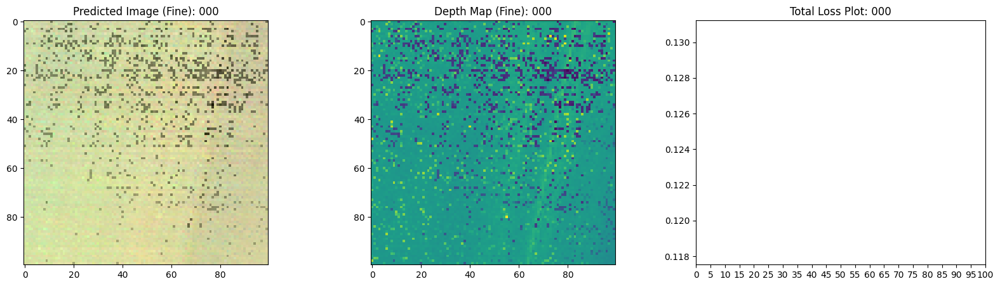

16/16 [==============================] - 15s 751ms/step - total_loss: 0.1244 - coarse_loss: 0.1244 - fine_loss: 0.0000e+00 - coarse_psnr: 9.4998 - fine_psnr: 6.4384 - val_total_loss: 0.3018 - val_coarse_loss: 0.0714 - val_fine_loss: 0.2303 - val_coarse_psnr: 11.9522 - val_fine_psnr: 6.3847
Epoch 2/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0664 - coarse_loss: 0.0664 - fine_loss: 0.0000e+00 - coarse_psnr: 12.3191 - fine_psnr: 6.4361

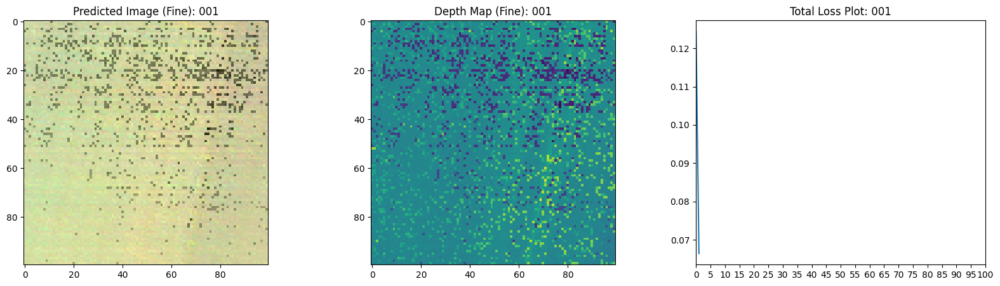

16/16 [==============================] - 11s 724ms/step - total_loss: 0.0664 - coarse_loss: 0.0664 - fine_loss: 0.0000e+00 - coarse_psnr: 12.3191 - fine_psnr: 6.4361 - val_total_loss: 0.2996 - val_coarse_loss: 0.0669 - val_fine_loss: 0.2327 - val_coarse_psnr: 12.1127 - val_fine_psnr: 6.3403
Epoch 3/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0594 - coarse_loss: 0.0594 - fine_loss: 0.0000e+00 - coarse_psnr: 12.6059 - fine_psnr: 6.4297

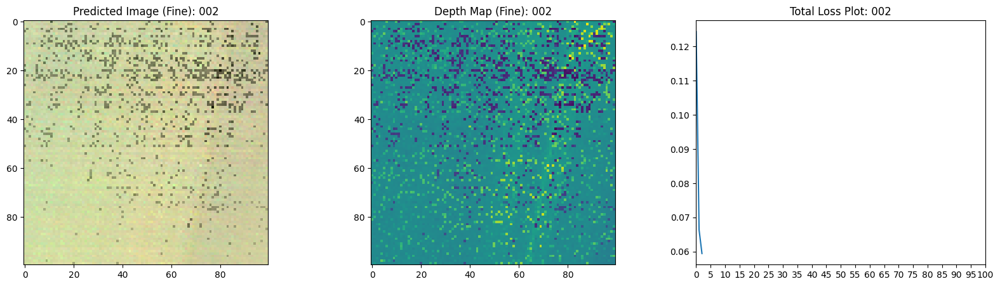

16/16 [==============================] - 11s 715ms/step - total_loss: 0.0594 - coarse_loss: 0.0594 - fine_loss: 0.0000e+00 - coarse_psnr: 12.6059 - fine_psnr: 6.4297 - val_total_loss: 0.2970 - val_coarse_loss: 0.0654 - val_fine_loss: 0.2316 - val_coarse_psnr: 12.2195 - val_fine_psnr: 6.3619
Epoch 4/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0584 - coarse_loss: 0.0584 - fine_loss: 0.0000e+00 - coarse_psnr: 12.7874 - fine_psnr: 6.4353

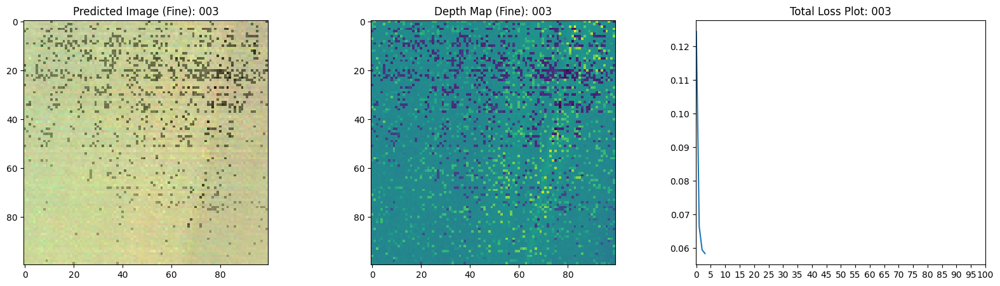

16/16 [==============================] - 11s 715ms/step - total_loss: 0.0584 - coarse_loss: 0.0584 - fine_loss: 0.0000e+00 - coarse_psnr: 12.7874 - fine_psnr: 6.4353 - val_total_loss: 0.2939 - val_coarse_loss: 0.0628 - val_fine_loss: 0.2311 - val_coarse_psnr: 12.4135 - val_fine_psnr: 6.3710
Epoch 5/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0570 - coarse_loss: 0.0570 - fine_loss: 0.0000e+00 - coarse_psnr: 12.8718 - fine_psnr: 6.4389

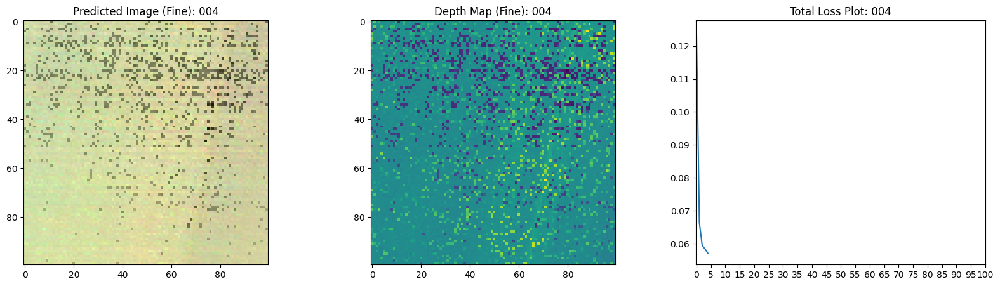

16/16 [==============================] - 11s 721ms/step - total_loss: 0.0570 - coarse_loss: 0.0570 - fine_loss: 0.0000e+00 - coarse_psnr: 12.8718 - fine_psnr: 6.4389 - val_total_loss: 0.2912 - val_coarse_loss: 0.0615 - val_fine_loss: 0.2298 - val_coarse_psnr: 12.4903 - val_fine_psnr: 6.3932
Epoch 6/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0552 - coarse_loss: 0.0552 - fine_loss: 0.0000e+00 - coarse_psnr: 12.9994 - fine_psnr: 6.4409

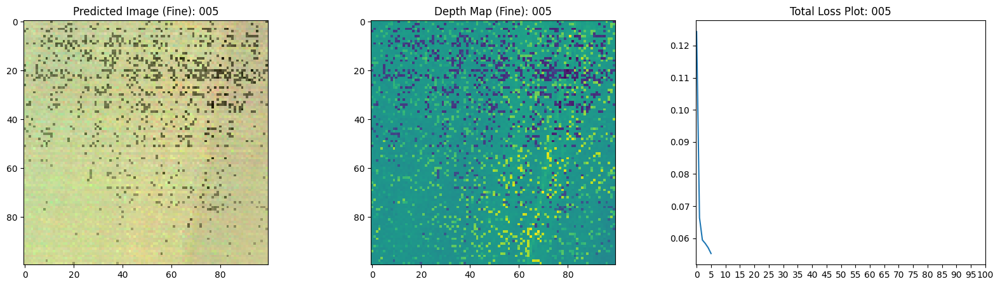

16/16 [==============================] - 11s 720ms/step - total_loss: 0.0552 - coarse_loss: 0.0552 - fine_loss: 0.0000e+00 - coarse_psnr: 12.9994 - fine_psnr: 6.4409 - val_total_loss: 0.2910 - val_coarse_loss: 0.0588 - val_fine_loss: 0.2322 - val_coarse_psnr: 12.6526 - val_fine_psnr: 6.3504
Epoch 7/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0489 - coarse_loss: 0.0489 - fine_loss: 0.0000e+00 - coarse_psnr: 13.5353 - fine_psnr: 6.4328

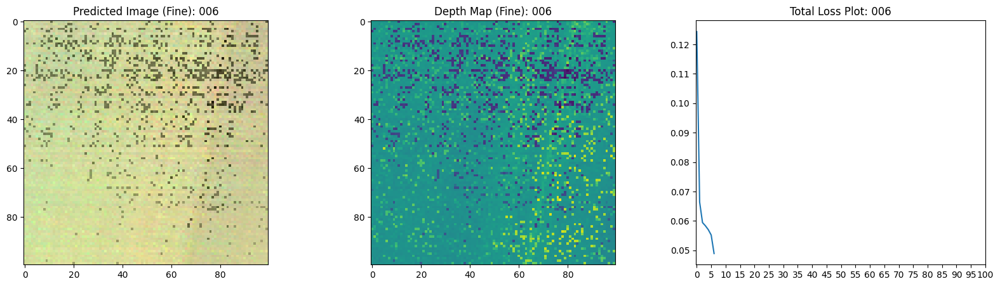

16/16 [==============================] - 11s 722ms/step - total_loss: 0.0489 - coarse_loss: 0.0489 - fine_loss: 0.0000e+00 - coarse_psnr: 13.5353 - fine_psnr: 6.4328 - val_total_loss: 0.2781 - val_coarse_loss: 0.0478 - val_fine_loss: 0.2303 - val_coarse_psnr: 13.4499 - val_fine_psnr: 6.3852
Epoch 8/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0388 - coarse_loss: 0.0388 - fine_loss: 0.0000e+00 - coarse_psnr: 14.4986 - fine_psnr: 6.4365

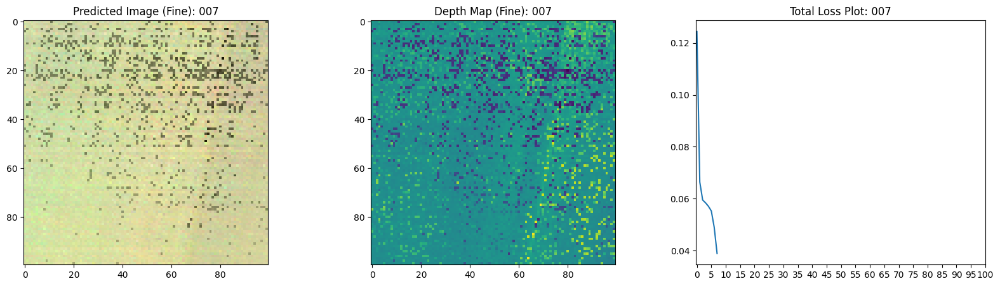

16/16 [==============================] - 11s 722ms/step - total_loss: 0.0388 - coarse_loss: 0.0388 - fine_loss: 0.0000e+00 - coarse_psnr: 14.4986 - fine_psnr: 6.4365 - val_total_loss: 0.2629 - val_coarse_loss: 0.0335 - val_fine_loss: 0.2294 - val_coarse_psnr: 14.9924 - val_fine_psnr: 6.4003
Epoch 9/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0304 - coarse_loss: 0.0304 - fine_loss: 0.0000e+00 - coarse_psnr: 15.4774 - fine_psnr: 6.4353

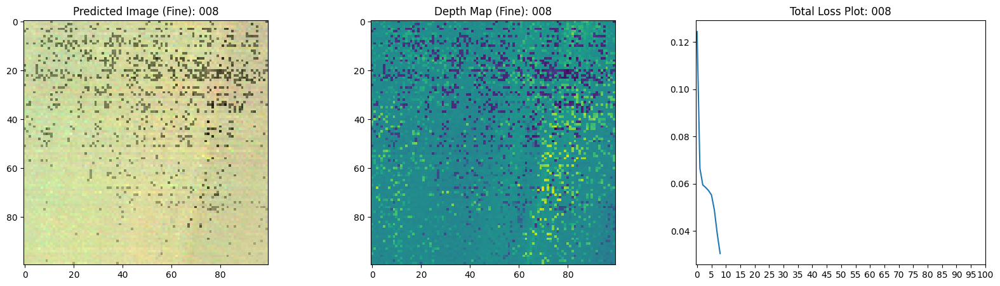

16/16 [==============================] - 11s 724ms/step - total_loss: 0.0304 - coarse_loss: 0.0304 - fine_loss: 0.0000e+00 - coarse_psnr: 15.4774 - fine_psnr: 6.4353 - val_total_loss: 0.2607 - val_coarse_loss: 0.0301 - val_fine_loss: 0.2306 - val_coarse_psnr: 15.3440 - val_fine_psnr: 6.3807
Epoch 10/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0267 - coarse_loss: 0.0267 - fine_loss: 0.0000e+00 - coarse_psnr: 16.0120 - fine_psnr: 6.4322

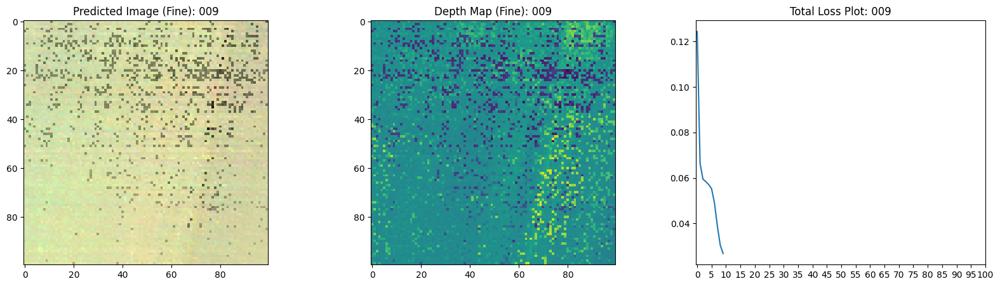

16/16 [==============================] - 11s 724ms/step - total_loss: 0.0267 - coarse_loss: 0.0267 - fine_loss: 0.0000e+00 - coarse_psnr: 16.0120 - fine_psnr: 6.4322 - val_total_loss: 0.2570 - val_coarse_loss: 0.0262 - val_fine_loss: 0.2309 - val_coarse_psnr: 16.0127 - val_fine_psnr: 6.3752
Epoch 11/100
16/16 [==============================] - ETA: 0s - total_loss: 0.1629 - coarse_loss: 0.0247 - fine_loss: 0.0922 - coarse_psnr: 16.3236 - fine_psnr: 11.0960

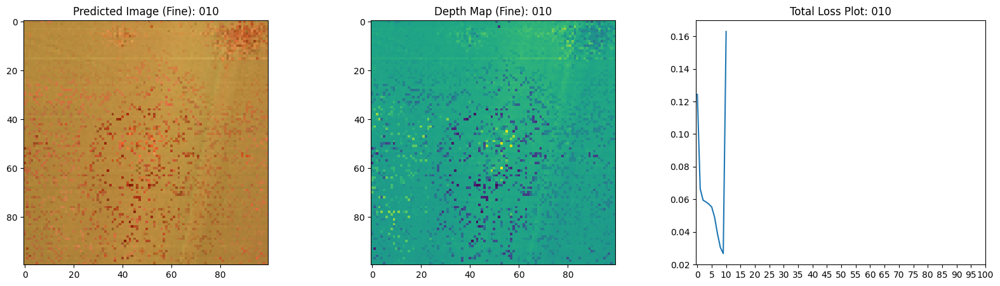

16/16 [==============================] - 12s 746ms/step - total_loss: 0.1629 - coarse_loss: 0.0247 - fine_loss: 0.0922 - coarse_psnr: 16.3236 - fine_psnr: 11.0960 - val_total_loss: 0.0935 - val_coarse_loss: 0.0235 - val_fine_loss: 0.0700 - val_coarse_psnr: 16.4361 - val_fine_psnr: 11.8899
Epoch 12/100
16/16 [==============================] - ETA: 0s - total_loss: 0.1116 - coarse_loss: 0.0220 - fine_loss: 0.0597 - coarse_psnr: 16.7955 - fine_psnr: 12.6417

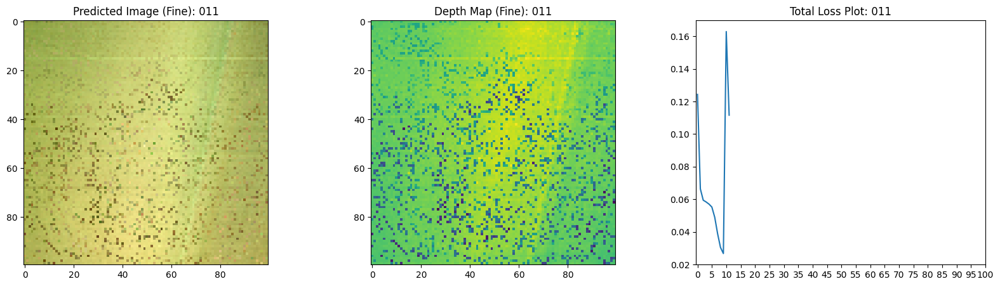

16/16 [==============================] - 12s 732ms/step - total_loss: 0.1116 - coarse_loss: 0.0220 - fine_loss: 0.0597 - coarse_psnr: 16.7955 - fine_psnr: 12.6417 - val_total_loss: 0.0887 - val_coarse_loss: 0.0214 - val_fine_loss: 0.0673 - val_coarse_psnr: 16.8370 - val_fine_psnr: 12.1163
Epoch 13/100
16/16 [==============================] - ETA: 0s - total_loss: 0.1015 - coarse_loss: 0.0200 - fine_loss: 0.0543 - coarse_psnr: 17.2010 - fine_psnr: 13.0793

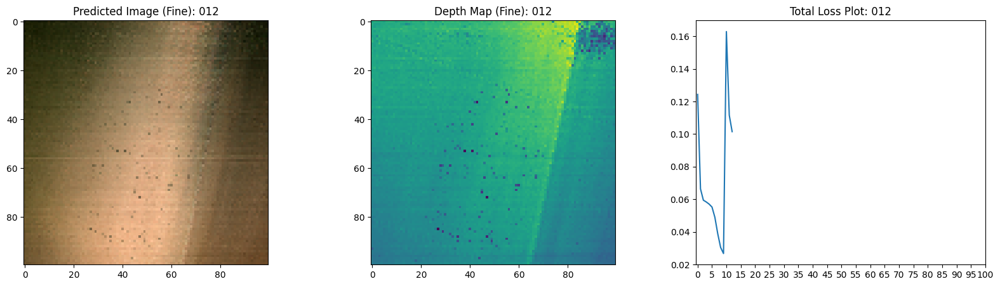

16/16 [==============================] - 12s 732ms/step - total_loss: 0.1015 - coarse_loss: 0.0200 - fine_loss: 0.0543 - coarse_psnr: 17.2010 - fine_psnr: 13.0793 - val_total_loss: 0.0842 - val_coarse_loss: 0.0191 - val_fine_loss: 0.0651 - val_coarse_psnr: 17.2278 - val_fine_psnr: 12.1753
Epoch 14/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0890 - coarse_loss: 0.0196 - fine_loss: 0.0462 - coarse_psnr: 17.2238 - fine_psnr: 13.8305

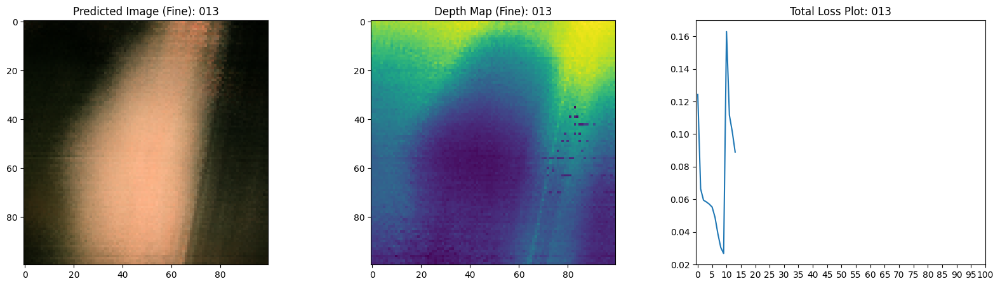

16/16 [==============================] - 12s 733ms/step - total_loss: 0.0890 - coarse_loss: 0.0196 - fine_loss: 0.0462 - coarse_psnr: 17.2238 - fine_psnr: 13.8305 - val_total_loss: 0.0661 - val_coarse_loss: 0.0202 - val_fine_loss: 0.0458 - val_coarse_psnr: 16.9991 - val_fine_psnr: 13.6575
Epoch 15/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0688 - coarse_loss: 0.0180 - fine_loss: 0.0339 - coarse_psnr: 17.6181 - fine_psnr: 15.1343

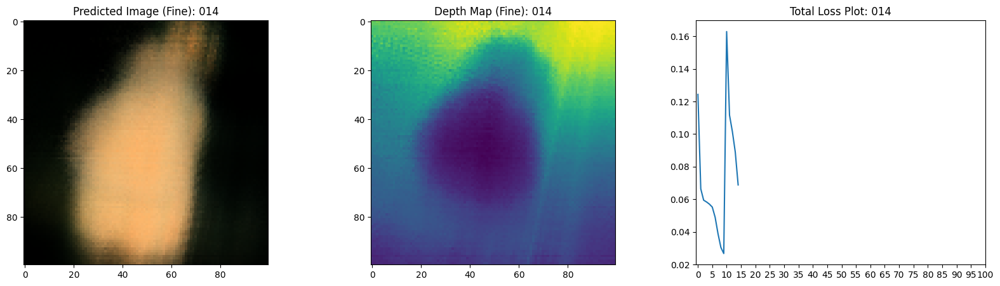

16/16 [==============================] - 12s 732ms/step - total_loss: 0.0688 - coarse_loss: 0.0180 - fine_loss: 0.0339 - coarse_psnr: 17.6181 - fine_psnr: 15.1343 - val_total_loss: 0.0483 - val_coarse_loss: 0.0162 - val_fine_loss: 0.0320 - val_coarse_psnr: 17.9531 - val_fine_psnr: 15.0813
Epoch 16/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0542 - coarse_loss: 0.0157 - fine_loss: 0.0256 - coarse_psnr: 18.1738 - fine_psnr: 16.1768

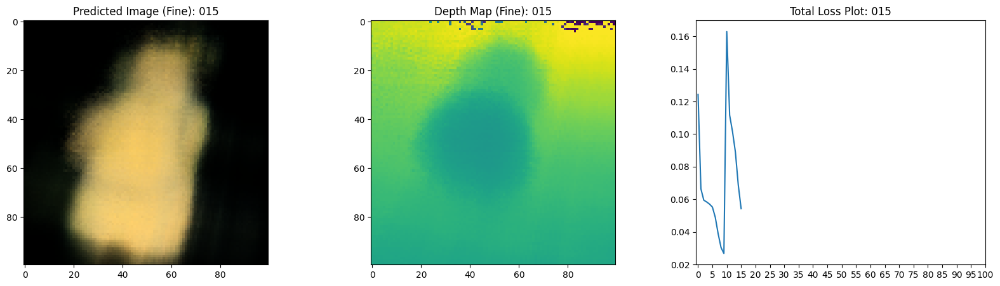

16/16 [==============================] - 12s 732ms/step - total_loss: 0.0542 - coarse_loss: 0.0157 - fine_loss: 0.0256 - coarse_psnr: 18.1738 - fine_psnr: 16.1768 - val_total_loss: 0.0381 - val_coarse_loss: 0.0148 - val_fine_loss: 0.0233 - val_coarse_psnr: 18.3584 - val_fine_psnr: 16.4404
Epoch 17/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0477 - coarse_loss: 0.0154 - fine_loss: 0.0216 - coarse_psnr: 18.2640 - fine_psnr: 16.8448

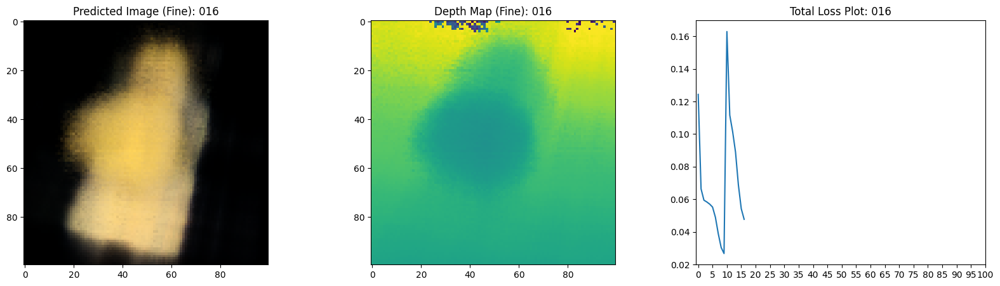

16/16 [==============================] - 12s 731ms/step - total_loss: 0.0477 - coarse_loss: 0.0154 - fine_loss: 0.0216 - coarse_psnr: 18.2640 - fine_psnr: 16.8448 - val_total_loss: 0.0347 - val_coarse_loss: 0.0140 - val_fine_loss: 0.0207 - val_coarse_psnr: 18.5978 - val_fine_psnr: 16.9158
Epoch 18/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0412 - coarse_loss: 0.0141 - fine_loss: 0.0181 - coarse_psnr: 18.6581 - fine_psnr: 17.6521

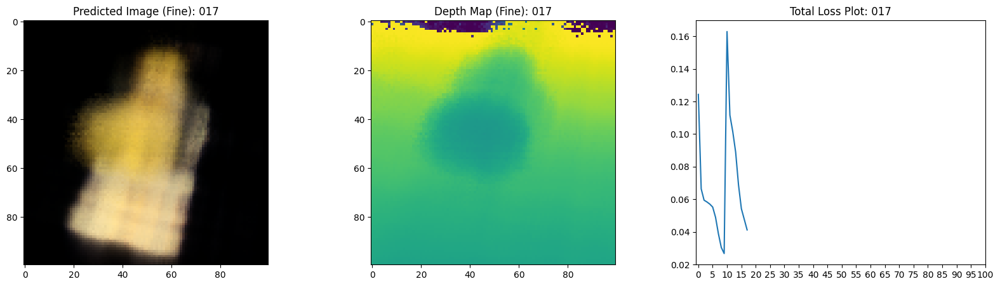

16/16 [==============================] - 12s 730ms/step - total_loss: 0.0412 - coarse_loss: 0.0141 - fine_loss: 0.0181 - coarse_psnr: 18.6581 - fine_psnr: 17.6521 - val_total_loss: 0.0298 - val_coarse_loss: 0.0137 - val_fine_loss: 0.0161 - val_coarse_psnr: 18.6916 - val_fine_psnr: 18.0340
Epoch 19/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0350 - coarse_loss: 0.0132 - fine_loss: 0.0146 - coarse_psnr: 18.9414 - fine_psnr: 18.5369

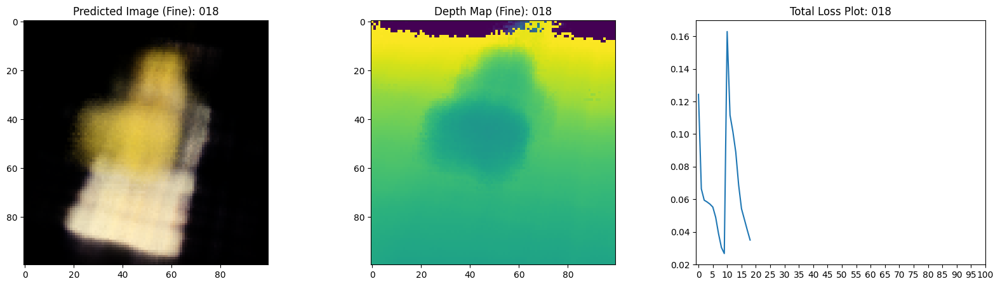

16/16 [==============================] - 12s 729ms/step - total_loss: 0.0350 - coarse_loss: 0.0132 - fine_loss: 0.0146 - coarse_psnr: 18.9414 - fine_psnr: 18.5369 - val_total_loss: 0.0276 - val_coarse_loss: 0.0130 - val_fine_loss: 0.0146 - val_coarse_psnr: 18.9160 - val_fine_psnr: 18.4389
Epoch 20/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0322 - coarse_loss: 0.0125 - fine_loss: 0.0131 - coarse_psnr: 19.1637 - fine_psnr: 18.9898

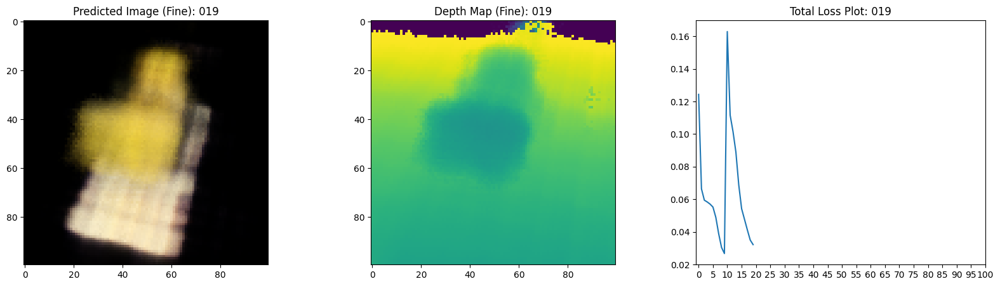

16/16 [==============================] - 12s 744ms/step - total_loss: 0.0322 - coarse_loss: 0.0125 - fine_loss: 0.0131 - coarse_psnr: 19.1637 - fine_psnr: 18.9898 - val_total_loss: 0.0252 - val_coarse_loss: 0.0124 - val_fine_loss: 0.0128 - val_coarse_psnr: 19.1082 - val_fine_psnr: 18.9679
Epoch 21/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0306 - coarse_loss: 0.0123 - fine_loss: 0.0122 - coarse_psnr: 19.2565 - fine_psnr: 19.2991

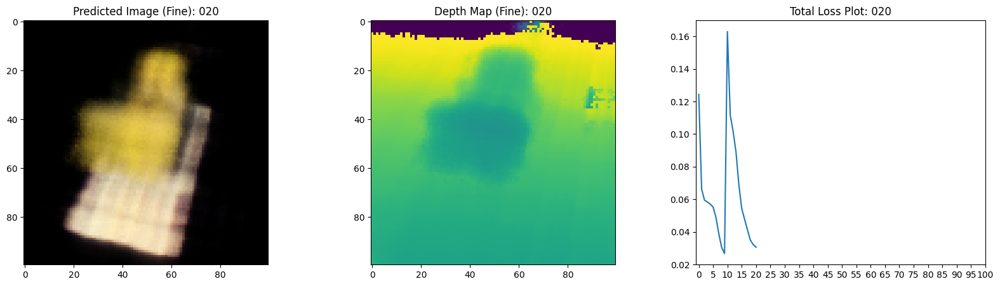

16/16 [==============================] - 12s 730ms/step - total_loss: 0.0306 - coarse_loss: 0.0123 - fine_loss: 0.0122 - coarse_psnr: 19.2565 - fine_psnr: 19.2991 - val_total_loss: 0.0234 - val_coarse_loss: 0.0116 - val_fine_loss: 0.0118 - val_coarse_psnr: 19.4485 - val_fine_psnr: 19.3939
Epoch 22/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0282 - coarse_loss: 0.0115 - fine_loss: 0.0112 - coarse_psnr: 19.5584 - fine_psnr: 19.6777

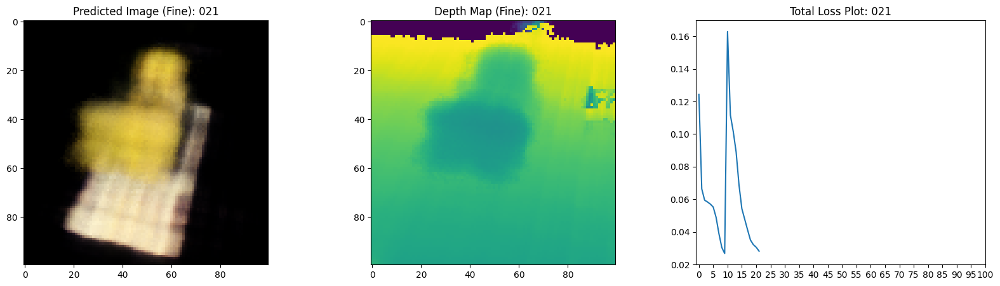

16/16 [==============================] - 12s 729ms/step - total_loss: 0.0282 - coarse_loss: 0.0115 - fine_loss: 0.0112 - coarse_psnr: 19.5584 - fine_psnr: 19.6777 - val_total_loss: 0.0223 - val_coarse_loss: 0.0112 - val_fine_loss: 0.0111 - val_coarse_psnr: 19.6239 - val_fine_psnr: 19.6301
Epoch 23/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0272 - coarse_loss: 0.0111 - fine_loss: 0.0107 - coarse_psnr: 19.6879 - fine_psnr: 19.8357

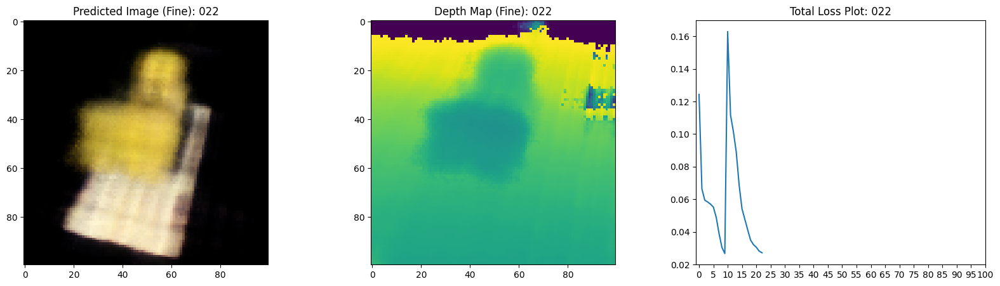

16/16 [==============================] - 12s 728ms/step - total_loss: 0.0272 - coarse_loss: 0.0111 - fine_loss: 0.0107 - coarse_psnr: 19.6879 - fine_psnr: 19.8357 - val_total_loss: 0.0216 - val_coarse_loss: 0.0108 - val_fine_loss: 0.0108 - val_coarse_psnr: 19.7438 - val_fine_psnr: 19.7673
Epoch 24/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0262 - coarse_loss: 0.0108 - fine_loss: 0.0103 - coarse_psnr: 19.8113 - fine_psnr: 20.0272

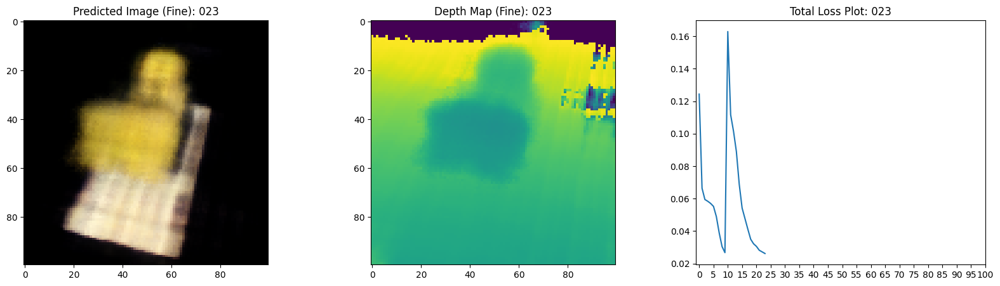

16/16 [==============================] - 12s 729ms/step - total_loss: 0.0262 - coarse_loss: 0.0108 - fine_loss: 0.0103 - coarse_psnr: 19.8113 - fine_psnr: 20.0272 - val_total_loss: 0.0207 - val_coarse_loss: 0.0106 - val_fine_loss: 0.0101 - val_coarse_psnr: 19.8064 - val_fine_psnr: 20.0388
Epoch 25/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0246 - coarse_loss: 0.0102 - fine_loss: 0.0095 - coarse_psnr: 20.0401 - fine_psnr: 20.3535

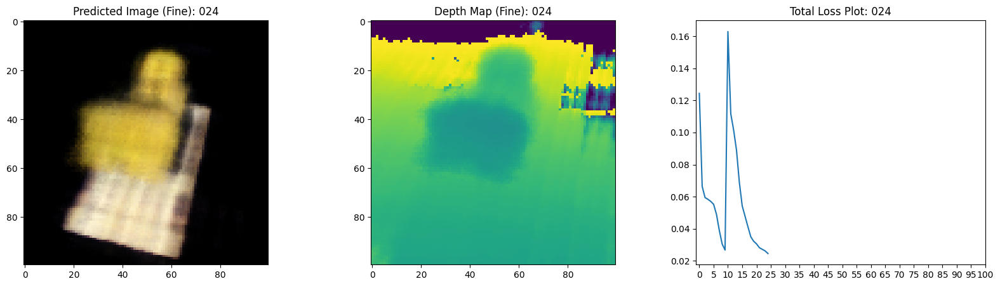

16/16 [==============================] - 12s 728ms/step - total_loss: 0.0246 - coarse_loss: 0.0102 - fine_loss: 0.0095 - coarse_psnr: 20.0401 - fine_psnr: 20.3535 - val_total_loss: 0.0195 - val_coarse_loss: 0.0099 - val_fine_loss: 0.0095 - val_coarse_psnr: 20.1275 - val_fine_psnr: 20.3232
Epoch 26/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0235 - coarse_loss: 0.0099 - fine_loss: 0.0091 - coarse_psnr: 20.1756 - fine_psnr: 20.5518

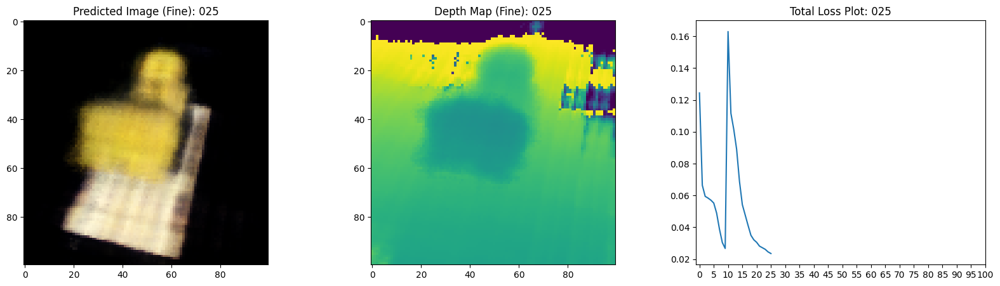

16/16 [==============================] - 12s 728ms/step - total_loss: 0.0235 - coarse_loss: 0.0099 - fine_loss: 0.0091 - coarse_psnr: 20.1756 - fine_psnr: 20.5518 - val_total_loss: 0.0191 - val_coarse_loss: 0.0098 - val_fine_loss: 0.0093 - val_coarse_psnr: 20.1975 - val_fine_psnr: 20.4017
Epoch 27/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0233 - coarse_loss: 0.0098 - fine_loss: 0.0090 - coarse_psnr: 20.2433 - fine_psnr: 20.5937

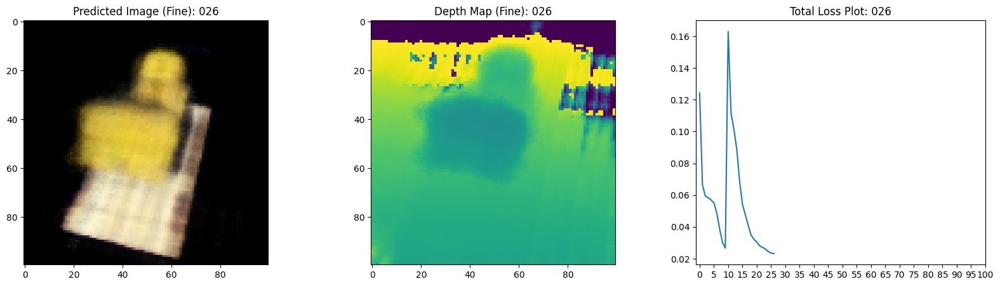

16/16 [==============================] - 12s 727ms/step - total_loss: 0.0233 - coarse_loss: 0.0098 - fine_loss: 0.0090 - coarse_psnr: 20.2433 - fine_psnr: 20.5937 - val_total_loss: 0.0191 - val_coarse_loss: 0.0097 - val_fine_loss: 0.0094 - val_coarse_psnr: 20.1943 - val_fine_psnr: 20.3069
Epoch 28/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0224 - coarse_loss: 0.0095 - fine_loss: 0.0086 - coarse_psnr: 20.3546 - fine_psnr: 20.8236

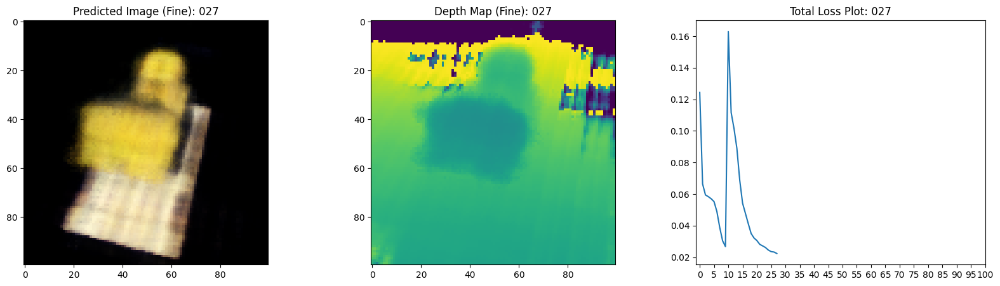

16/16 [==============================] - 12s 727ms/step - total_loss: 0.0224 - coarse_loss: 0.0095 - fine_loss: 0.0086 - coarse_psnr: 20.3546 - fine_psnr: 20.8236 - val_total_loss: 0.0176 - val_coarse_loss: 0.0092 - val_fine_loss: 0.0084 - val_coarse_psnr: 20.4757 - val_fine_psnr: 20.8468
Epoch 29/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0215 - coarse_loss: 0.0092 - fine_loss: 0.0082 - coarse_psnr: 20.5144 - fine_psnr: 21.0053

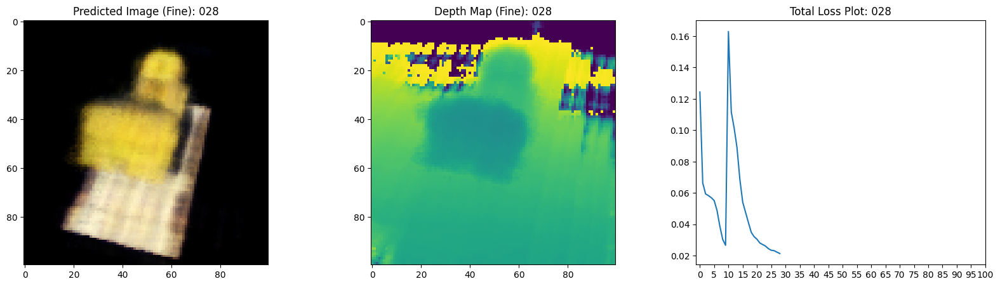

16/16 [==============================] - 12s 727ms/step - total_loss: 0.0215 - coarse_loss: 0.0092 - fine_loss: 0.0082 - coarse_psnr: 20.5144 - fine_psnr: 21.0053 - val_total_loss: 0.0163 - val_coarse_loss: 0.0085 - val_fine_loss: 0.0078 - val_coarse_psnr: 20.7900 - val_fine_psnr: 21.2052
Epoch 30/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0208 - coarse_loss: 0.0089 - fine_loss: 0.0079 - coarse_psnr: 20.6391 - fine_psnr: 21.1422

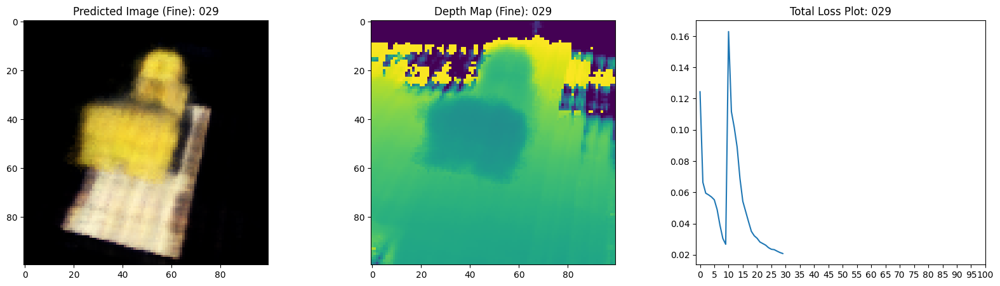

16/16 [==============================] - 12s 743ms/step - total_loss: 0.0208 - coarse_loss: 0.0089 - fine_loss: 0.0079 - coarse_psnr: 20.6391 - fine_psnr: 21.1422 - val_total_loss: 0.0168 - val_coarse_loss: 0.0087 - val_fine_loss: 0.0081 - val_coarse_psnr: 20.6886 - val_fine_psnr: 21.0401
Epoch 31/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0205 - coarse_loss: 0.0088 - fine_loss: 0.0078 - coarse_psnr: 20.6768 - fine_psnr: 21.2006

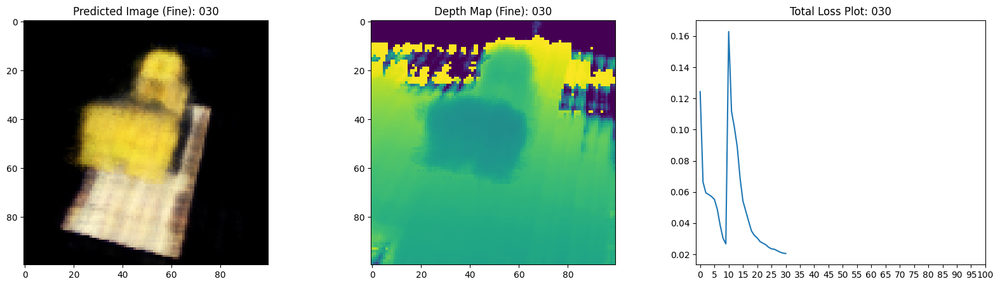

16/16 [==============================] - 12s 726ms/step - total_loss: 0.0205 - coarse_loss: 0.0088 - fine_loss: 0.0078 - coarse_psnr: 20.6768 - fine_psnr: 21.2006 - val_total_loss: 0.0163 - val_coarse_loss: 0.0085 - val_fine_loss: 0.0078 - val_coarse_psnr: 20.8456 - val_fine_psnr: 21.1514
Epoch 32/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0201 - coarse_loss: 0.0085 - fine_loss: 0.0077 - coarse_psnr: 20.8381 - fine_psnr: 21.2846

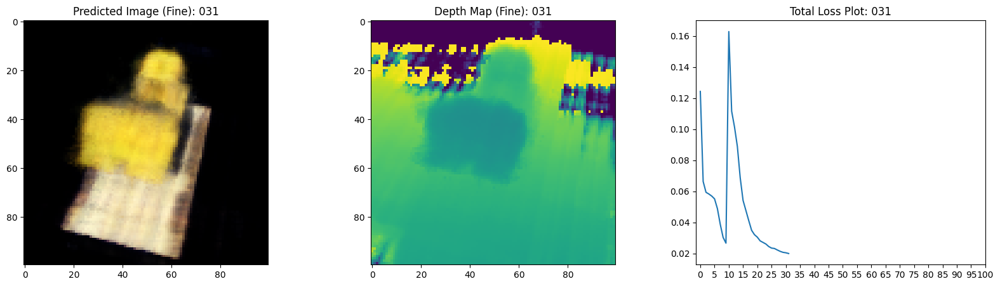

16/16 [==============================] - 12s 726ms/step - total_loss: 0.0201 - coarse_loss: 0.0085 - fine_loss: 0.0077 - coarse_psnr: 20.8381 - fine_psnr: 21.2846 - val_total_loss: 0.0157 - val_coarse_loss: 0.0083 - val_fine_loss: 0.0075 - val_coarse_psnr: 20.9721 - val_fine_psnr: 21.3515
Epoch 33/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0191 - coarse_loss: 0.0082 - fine_loss: 0.0072 - coarse_psnr: 20.9961 - fine_psnr: 21.5702

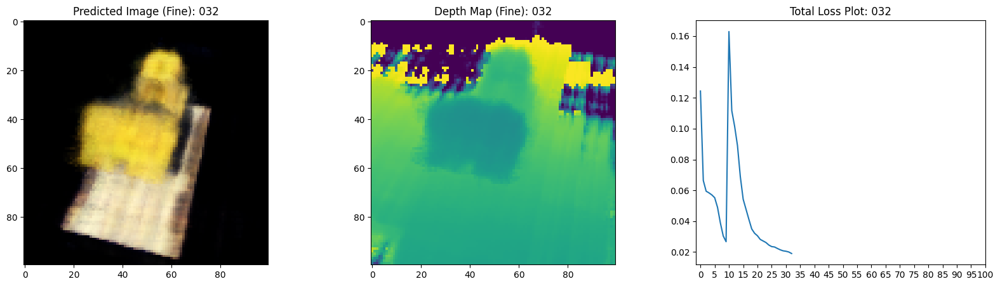

16/16 [==============================] - 12s 726ms/step - total_loss: 0.0191 - coarse_loss: 0.0082 - fine_loss: 0.0072 - coarse_psnr: 20.9961 - fine_psnr: 21.5702 - val_total_loss: 0.0152 - val_coarse_loss: 0.0081 - val_fine_loss: 0.0072 - val_coarse_psnr: 21.0873 - val_fine_psnr: 21.5694
Epoch 34/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0188 - coarse_loss: 0.0082 - fine_loss: 0.0071 - coarse_psnr: 21.0461 - fine_psnr: 21.6394

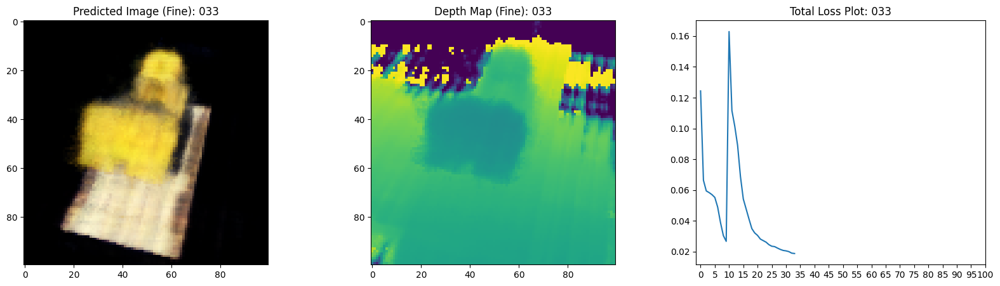

16/16 [==============================] - 12s 727ms/step - total_loss: 0.0188 - coarse_loss: 0.0082 - fine_loss: 0.0071 - coarse_psnr: 21.0461 - fine_psnr: 21.6394 - val_total_loss: 0.0153 - val_coarse_loss: 0.0079 - val_fine_loss: 0.0074 - val_coarse_psnr: 21.1771 - val_fine_psnr: 21.3770
Epoch 35/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0186 - coarse_loss: 0.0080 - fine_loss: 0.0071 - coarse_psnr: 21.1217 - fine_psnr: 21.6536

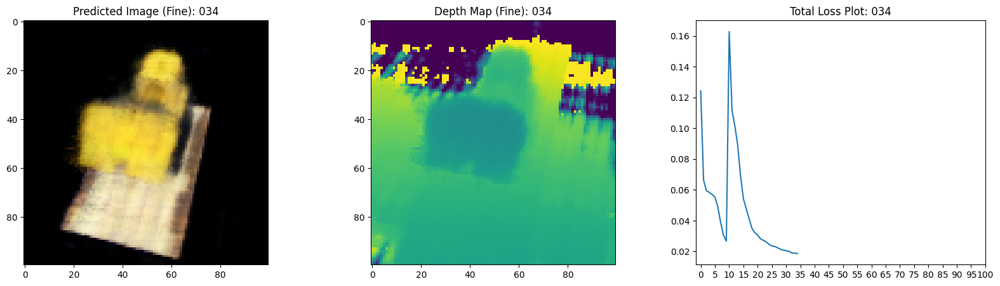

16/16 [==============================] - 12s 727ms/step - total_loss: 0.0186 - coarse_loss: 0.0080 - fine_loss: 0.0071 - coarse_psnr: 21.1217 - fine_psnr: 21.6536 - val_total_loss: 0.0150 - val_coarse_loss: 0.0078 - val_fine_loss: 0.0072 - val_coarse_psnr: 21.1601 - val_fine_psnr: 21.5241
Epoch 36/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0183 - coarse_loss: 0.0079 - fine_loss: 0.0069 - coarse_psnr: 21.1726 - fine_psnr: 21.7380

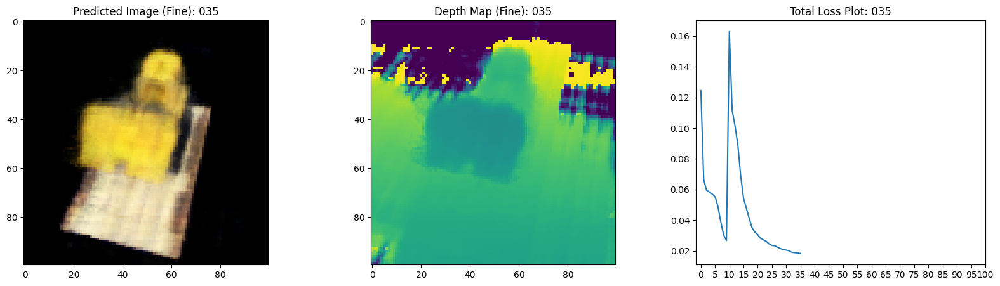

16/16 [==============================] - 12s 727ms/step - total_loss: 0.0183 - coarse_loss: 0.0079 - fine_loss: 0.0069 - coarse_psnr: 21.1726 - fine_psnr: 21.7380 - val_total_loss: 0.0147 - val_coarse_loss: 0.0078 - val_fine_loss: 0.0070 - val_coarse_psnr: 21.2171 - val_fine_psnr: 21.6905
Epoch 37/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0180 - coarse_loss: 0.0078 - fine_loss: 0.0068 - coarse_psnr: 21.2135 - fine_psnr: 21.8389

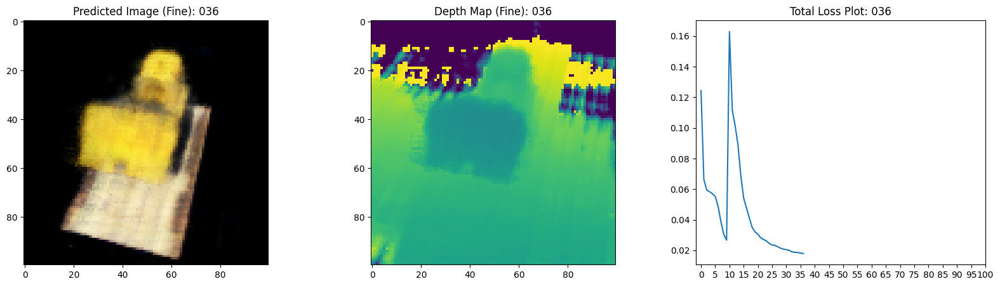

16/16 [==============================] - 12s 726ms/step - total_loss: 0.0180 - coarse_loss: 0.0078 - fine_loss: 0.0068 - coarse_psnr: 21.2135 - fine_psnr: 21.8389 - val_total_loss: 0.0146 - val_coarse_loss: 0.0077 - val_fine_loss: 0.0070 - val_coarse_psnr: 21.2672 - val_fine_psnr: 21.6815
Epoch 38/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0175 - coarse_loss: 0.0077 - fine_loss: 0.0065 - coarse_psnr: 21.2716 - fine_psnr: 22.0298

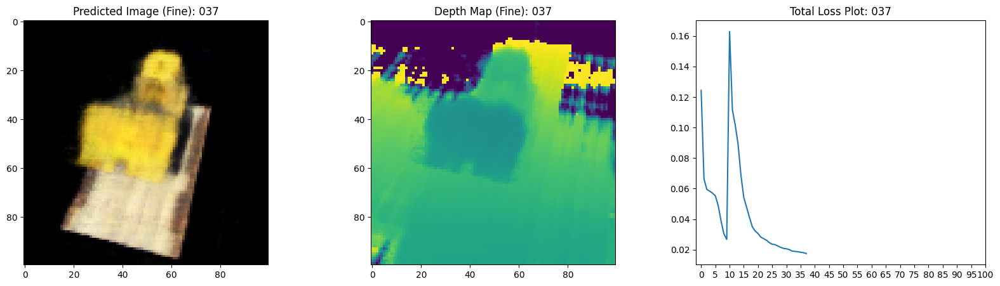

16/16 [==============================] - 12s 726ms/step - total_loss: 0.0175 - coarse_loss: 0.0077 - fine_loss: 0.0065 - coarse_psnr: 21.2716 - fine_psnr: 22.0298 - val_total_loss: 0.0142 - val_coarse_loss: 0.0077 - val_fine_loss: 0.0065 - val_coarse_psnr: 21.2514 - val_fine_psnr: 22.0048
Epoch 39/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0175 - coarse_loss: 0.0080 - fine_loss: 0.0064 - coarse_psnr: 21.1241 - fine_psnr: 22.1191

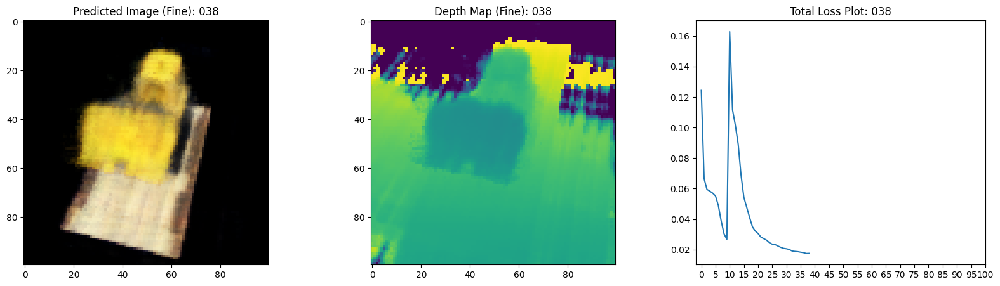

16/16 [==============================] - 12s 743ms/step - total_loss: 0.0175 - coarse_loss: 0.0080 - fine_loss: 0.0064 - coarse_psnr: 21.1241 - fine_psnr: 22.1191 - val_total_loss: 0.0142 - val_coarse_loss: 0.0076 - val_fine_loss: 0.0066 - val_coarse_psnr: 21.3277 - val_fine_psnr: 21.8962
Epoch 40/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0169 - coarse_loss: 0.0075 - fine_loss: 0.0063 - coarse_psnr: 21.4011 - fine_psnr: 22.1752

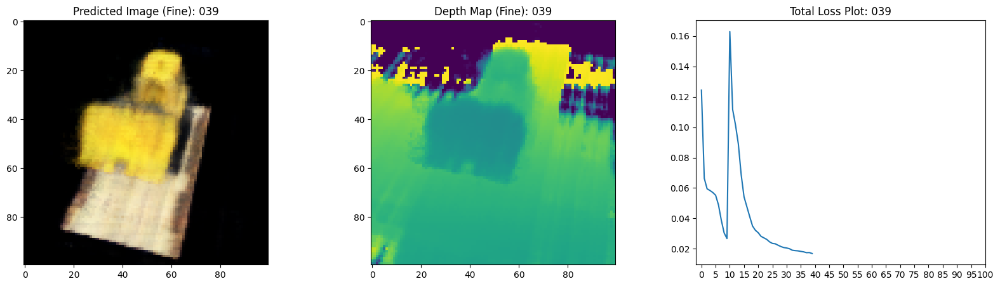

16/16 [==============================] - 12s 725ms/step - total_loss: 0.0169 - coarse_loss: 0.0075 - fine_loss: 0.0063 - coarse_psnr: 21.4011 - fine_psnr: 22.1752 - val_total_loss: 0.0138 - val_coarse_loss: 0.0073 - val_fine_loss: 0.0065 - val_coarse_psnr: 21.4782 - val_fine_psnr: 21.9950
Epoch 41/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0171 - coarse_loss: 0.0075 - fine_loss: 0.0064 - coarse_psnr: 21.3971 - fine_psnr: 22.0978

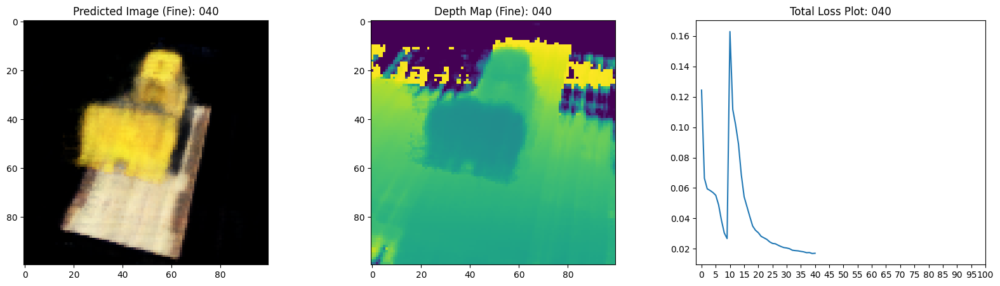

16/16 [==============================] - 12s 726ms/step - total_loss: 0.0171 - coarse_loss: 0.0075 - fine_loss: 0.0064 - coarse_psnr: 21.3971 - fine_psnr: 22.0978 - val_total_loss: 0.0140 - val_coarse_loss: 0.0075 - val_fine_loss: 0.0065 - val_coarse_psnr: 21.3559 - val_fine_psnr: 21.9769
Epoch 42/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0167 - coarse_loss: 0.0074 - fine_loss: 0.0062 - coarse_psnr: 21.4585 - fine_psnr: 22.2058

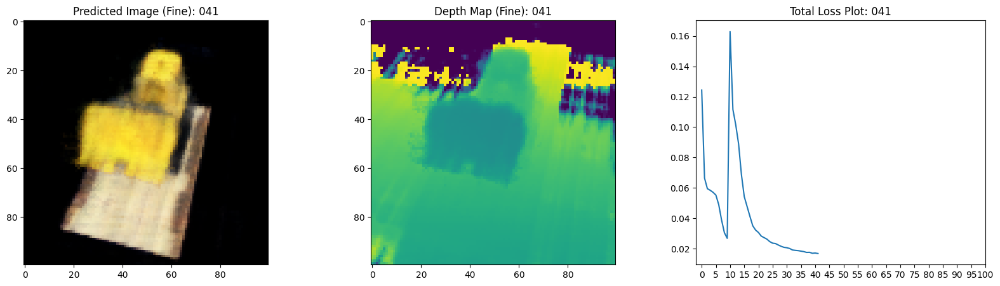

16/16 [==============================] - 12s 725ms/step - total_loss: 0.0167 - coarse_loss: 0.0074 - fine_loss: 0.0062 - coarse_psnr: 21.4585 - fine_psnr: 22.2058 - val_total_loss: 0.0138 - val_coarse_loss: 0.0074 - val_fine_loss: 0.0064 - val_coarse_psnr: 21.3553 - val_fine_psnr: 21.9940
Epoch 43/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0164 - coarse_loss: 0.0073 - fine_loss: 0.0060 - coarse_psnr: 21.5302 - fine_psnr: 22.3315

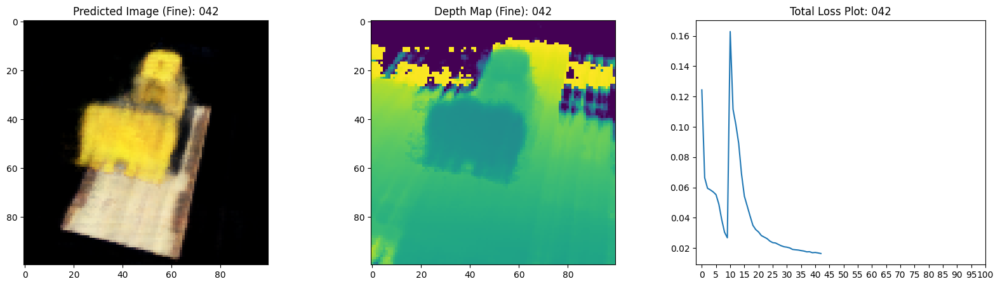

16/16 [==============================] - 12s 725ms/step - total_loss: 0.0164 - coarse_loss: 0.0073 - fine_loss: 0.0060 - coarse_psnr: 21.5302 - fine_psnr: 22.3315 - val_total_loss: 0.0133 - val_coarse_loss: 0.0071 - val_fine_loss: 0.0062 - val_coarse_psnr: 21.5761 - val_fine_psnr: 22.1676
Epoch 44/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0161 - coarse_loss: 0.0072 - fine_loss: 0.0060 - coarse_psnr: 21.5626 - fine_psnr: 22.3604

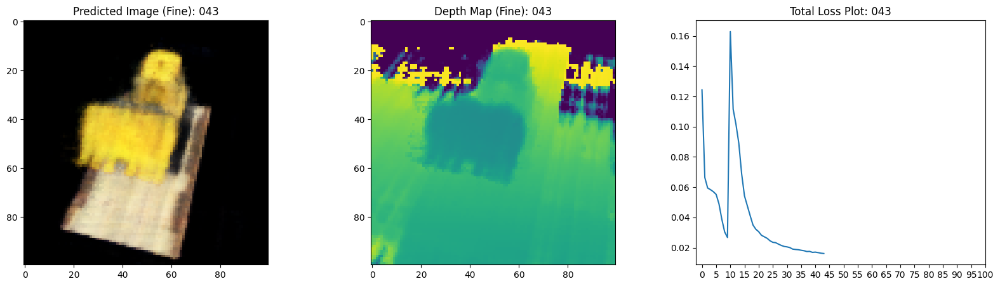

16/16 [==============================] - 12s 726ms/step - total_loss: 0.0161 - coarse_loss: 0.0072 - fine_loss: 0.0060 - coarse_psnr: 21.5626 - fine_psnr: 22.3604 - val_total_loss: 0.0131 - val_coarse_loss: 0.0071 - val_fine_loss: 0.0061 - val_coarse_psnr: 21.5926 - val_fine_psnr: 22.2232
Epoch 45/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0157 - coarse_loss: 0.0070 - fine_loss: 0.0058 - coarse_psnr: 21.7067 - fine_psnr: 22.4986

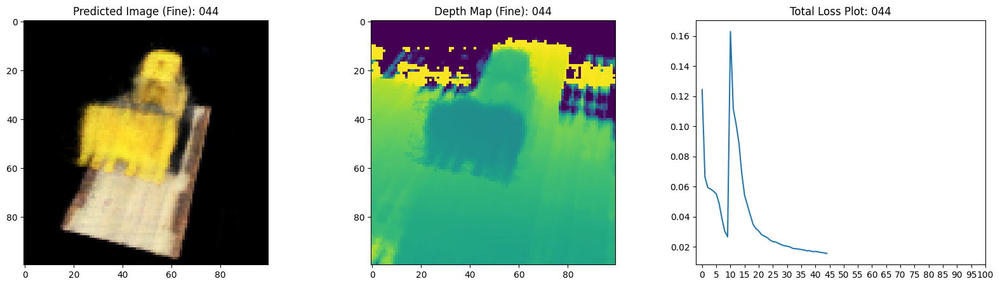

16/16 [==============================] - 12s 725ms/step - total_loss: 0.0157 - coarse_loss: 0.0070 - fine_loss: 0.0058 - coarse_psnr: 21.7067 - fine_psnr: 22.4986 - val_total_loss: 0.0127 - val_coarse_loss: 0.0068 - val_fine_loss: 0.0059 - val_coarse_psnr: 21.7638 - val_fine_psnr: 22.3776
Epoch 46/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0157 - coarse_loss: 0.0070 - fine_loss: 0.0058 - coarse_psnr: 21.6822 - fine_psnr: 22.4908

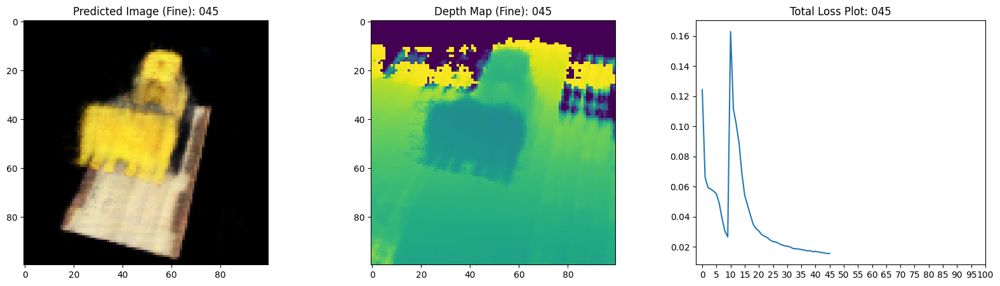

16/16 [==============================] - 12s 725ms/step - total_loss: 0.0157 - coarse_loss: 0.0070 - fine_loss: 0.0058 - coarse_psnr: 21.6822 - fine_psnr: 22.4908 - val_total_loss: 0.0130 - val_coarse_loss: 0.0068 - val_fine_loss: 0.0062 - val_coarse_psnr: 21.7672 - val_fine_psnr: 22.1318
Epoch 47/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0160 - coarse_loss: 0.0070 - fine_loss: 0.0060 - coarse_psnr: 21.6840 - fine_psnr: 22.3339

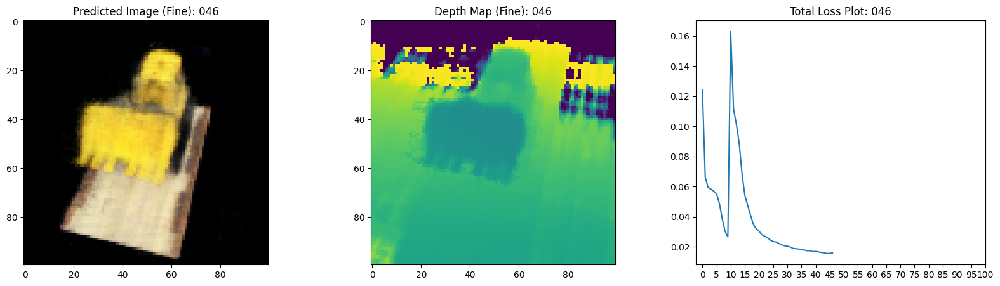

16/16 [==============================] - 12s 726ms/step - total_loss: 0.0160 - coarse_loss: 0.0070 - fine_loss: 0.0060 - coarse_psnr: 21.6840 - fine_psnr: 22.3339 - val_total_loss: 0.0128 - val_coarse_loss: 0.0066 - val_fine_loss: 0.0061 - val_coarse_psnr: 21.8430 - val_fine_psnr: 22.1740
Epoch 48/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0153 - coarse_loss: 0.0068 - fine_loss: 0.0057 - coarse_psnr: 21.8507 - fine_psnr: 22.6231

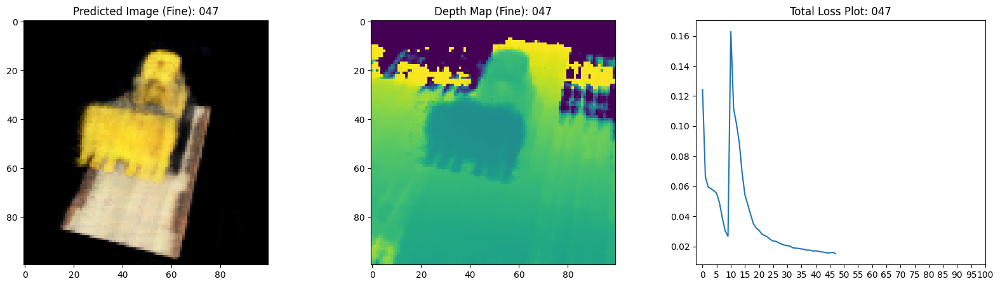

16/16 [==============================] - 11s 725ms/step - total_loss: 0.0153 - coarse_loss: 0.0068 - fine_loss: 0.0057 - coarse_psnr: 21.8507 - fine_psnr: 22.6231 - val_total_loss: 0.0123 - val_coarse_loss: 0.0067 - val_fine_loss: 0.0056 - val_coarse_psnr: 21.8488 - val_fine_psnr: 22.6449
Epoch 49/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0150 - coarse_loss: 0.0068 - fine_loss: 0.0055 - coarse_psnr: 21.8493 - fine_psnr: 22.7368

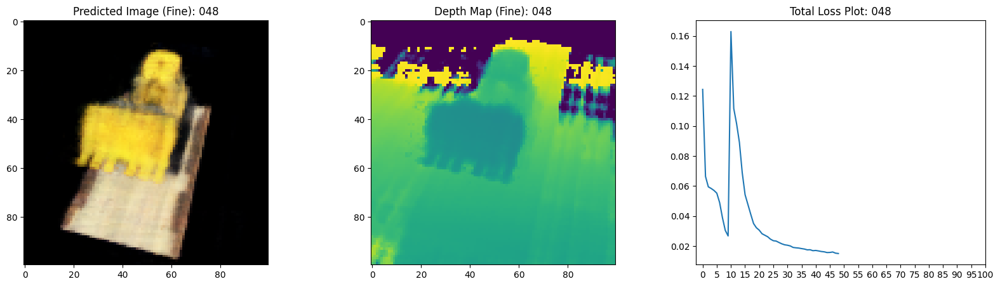

16/16 [==============================] - 12s 741ms/step - total_loss: 0.0150 - coarse_loss: 0.0068 - fine_loss: 0.0055 - coarse_psnr: 21.8493 - fine_psnr: 22.7368 - val_total_loss: 0.0125 - val_coarse_loss: 0.0069 - val_fine_loss: 0.0057 - val_coarse_psnr: 21.6778 - val_fine_psnr: 22.5332
Epoch 50/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0152 - coarse_loss: 0.0069 - fine_loss: 0.0055 - coarse_psnr: 21.7901 - fine_psnr: 22.7071

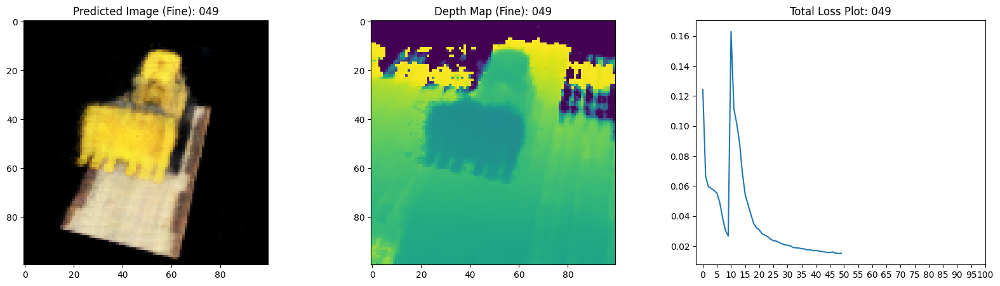

16/16 [==============================] - 12s 725ms/step - total_loss: 0.0152 - coarse_loss: 0.0069 - fine_loss: 0.0055 - coarse_psnr: 21.7901 - fine_psnr: 22.7071 - val_total_loss: 0.0118 - val_coarse_loss: 0.0065 - val_fine_loss: 0.0053 - val_coarse_psnr: 21.9722 - val_fine_psnr: 22.8329
Epoch 51/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0148 - coarse_loss: 0.0068 - fine_loss: 0.0053 - coarse_psnr: 21.8083 - fine_psnr: 22.8750

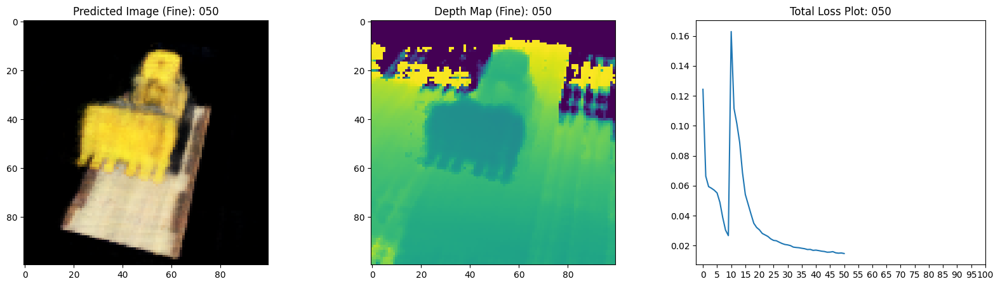

16/16 [==============================] - 12s 725ms/step - total_loss: 0.0148 - coarse_loss: 0.0068 - fine_loss: 0.0053 - coarse_psnr: 21.8083 - fine_psnr: 22.8750 - val_total_loss: 0.0117 - val_coarse_loss: 0.0064 - val_fine_loss: 0.0054 - val_coarse_psnr: 22.0483 - val_fine_psnr: 22.7930
Epoch 52/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0146 - coarse_loss: 0.0066 - fine_loss: 0.0053 - coarse_psnr: 21.9206 - fine_psnr: 22.8714

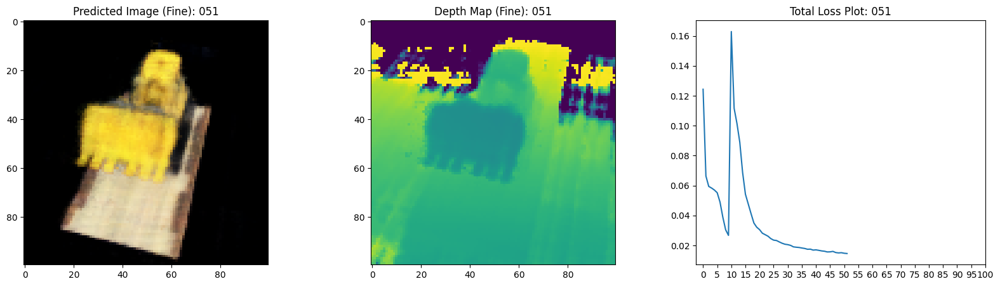

16/16 [==============================] - 12s 726ms/step - total_loss: 0.0146 - coarse_loss: 0.0066 - fine_loss: 0.0053 - coarse_psnr: 21.9206 - fine_psnr: 22.8714 - val_total_loss: 0.0118 - val_coarse_loss: 0.0064 - val_fine_loss: 0.0054 - val_coarse_psnr: 22.0161 - val_fine_psnr: 22.7226
Epoch 53/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0142 - coarse_loss: 0.0065 - fine_loss: 0.0052 - coarse_psnr: 22.0473 - fine_psnr: 22.9899

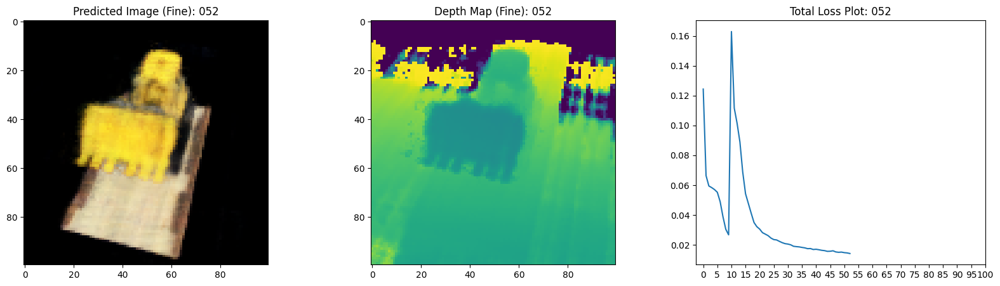

16/16 [==============================] - 12s 726ms/step - total_loss: 0.0142 - coarse_loss: 0.0065 - fine_loss: 0.0052 - coarse_psnr: 22.0473 - fine_psnr: 22.9899 - val_total_loss: 0.0114 - val_coarse_loss: 0.0062 - val_fine_loss: 0.0052 - val_coarse_psnr: 22.1763 - val_fine_psnr: 22.9603
Epoch 54/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0141 - coarse_loss: 0.0064 - fine_loss: 0.0051 - coarse_psnr: 22.1071 - fine_psnr: 23.0271

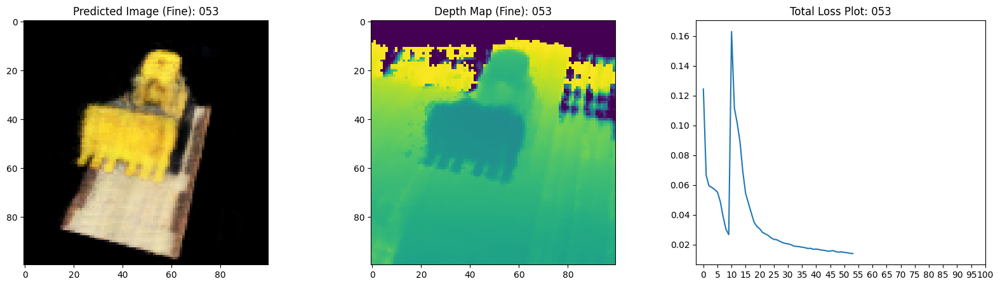

16/16 [==============================] - 12s 726ms/step - total_loss: 0.0141 - coarse_loss: 0.0064 - fine_loss: 0.0051 - coarse_psnr: 22.1071 - fine_psnr: 23.0271 - val_total_loss: 0.0111 - val_coarse_loss: 0.0061 - val_fine_loss: 0.0050 - val_coarse_psnr: 22.3157 - val_fine_psnr: 23.1201
Epoch 55/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0139 - coarse_loss: 0.0063 - fine_loss: 0.0051 - coarse_psnr: 22.1651 - fine_psnr: 23.0645

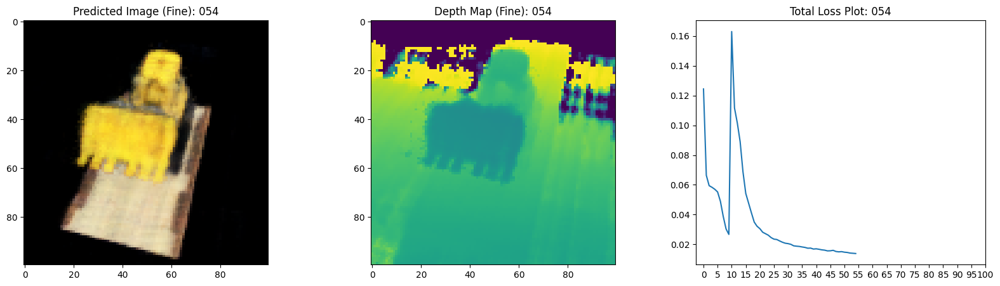

16/16 [==============================] - 12s 726ms/step - total_loss: 0.0139 - coarse_loss: 0.0063 - fine_loss: 0.0051 - coarse_psnr: 22.1651 - fine_psnr: 23.0645 - val_total_loss: 0.0113 - val_coarse_loss: 0.0062 - val_fine_loss: 0.0051 - val_coarse_psnr: 22.1650 - val_fine_psnr: 22.9550
Epoch 56/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0140 - coarse_loss: 0.0062 - fine_loss: 0.0051 - coarse_psnr: 22.1924 - fine_psnr: 23.0153

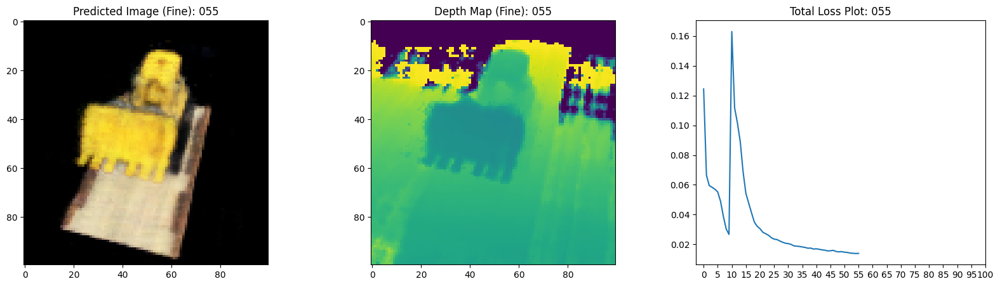

16/16 [==============================] - 12s 726ms/step - total_loss: 0.0140 - coarse_loss: 0.0062 - fine_loss: 0.0051 - coarse_psnr: 22.1924 - fine_psnr: 23.0153 - val_total_loss: 0.0111 - val_coarse_loss: 0.0061 - val_fine_loss: 0.0050 - val_coarse_psnr: 22.2701 - val_fine_psnr: 23.0892
Epoch 57/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0136 - coarse_loss: 0.0061 - fine_loss: 0.0050 - coarse_psnr: 22.3001 - fine_psnr: 23.1506

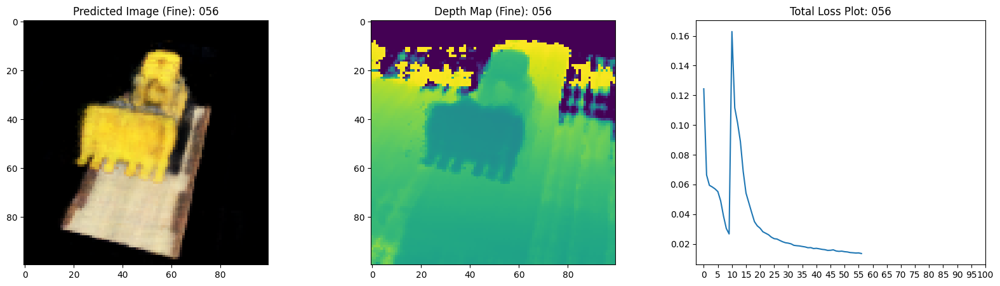

16/16 [==============================] - 12s 726ms/step - total_loss: 0.0136 - coarse_loss: 0.0061 - fine_loss: 0.0050 - coarse_psnr: 22.3001 - fine_psnr: 23.1506 - val_total_loss: 0.0108 - val_coarse_loss: 0.0060 - val_fine_loss: 0.0048 - val_coarse_psnr: 22.3539 - val_fine_psnr: 23.2458
Epoch 58/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0133 - coarse_loss: 0.0060 - fine_loss: 0.0048 - coarse_psnr: 22.3510 - fine_psnr: 23.2890

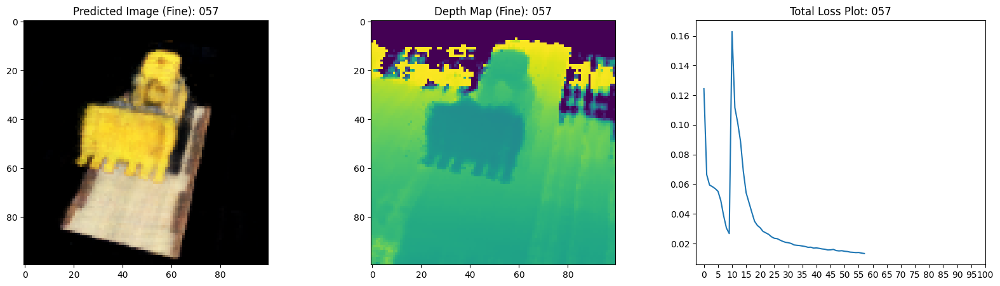

16/16 [==============================] - 12s 742ms/step - total_loss: 0.0133 - coarse_loss: 0.0060 - fine_loss: 0.0048 - coarse_psnr: 22.3510 - fine_psnr: 23.2890 - val_total_loss: 0.0109 - val_coarse_loss: 0.0060 - val_fine_loss: 0.0049 - val_coarse_psnr: 22.3561 - val_fine_psnr: 23.1870
Epoch 59/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0133 - coarse_loss: 0.0060 - fine_loss: 0.0049 - coarse_psnr: 22.3891 - fine_psnr: 23.2623

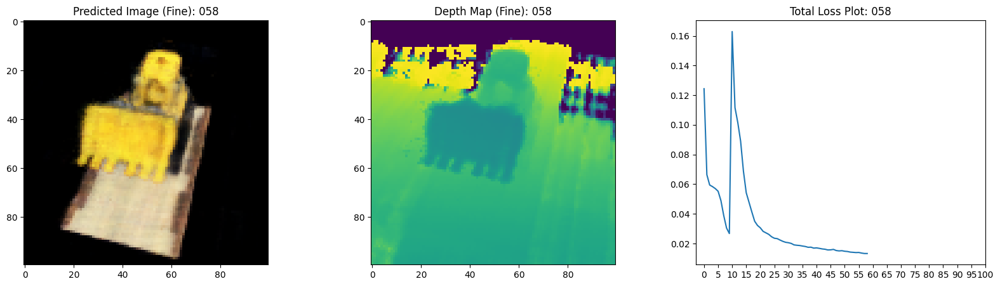

16/16 [==============================] - 12s 726ms/step - total_loss: 0.0133 - coarse_loss: 0.0060 - fine_loss: 0.0049 - coarse_psnr: 22.3891 - fine_psnr: 23.2623 - val_total_loss: 0.0107 - val_coarse_loss: 0.0059 - val_fine_loss: 0.0048 - val_coarse_psnr: 22.3616 - val_fine_psnr: 23.2475
Epoch 60/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0133 - coarse_loss: 0.0060 - fine_loss: 0.0048 - coarse_psnr: 22.3667 - fine_psnr: 23.2817

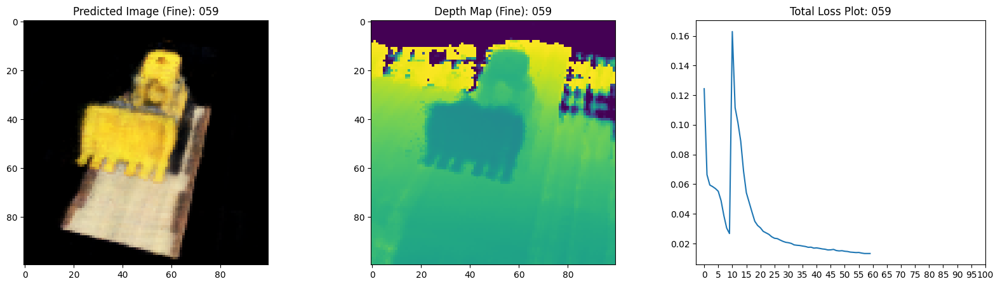

16/16 [==============================] - 12s 726ms/step - total_loss: 0.0133 - coarse_loss: 0.0060 - fine_loss: 0.0048 - coarse_psnr: 22.3667 - fine_psnr: 23.2817 - val_total_loss: 0.0108 - val_coarse_loss: 0.0060 - val_fine_loss: 0.0049 - val_coarse_psnr: 22.3560 - val_fine_psnr: 23.1802
Epoch 61/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0131 - coarse_loss: 0.0059 - fine_loss: 0.0048 - coarse_psnr: 22.4032 - fine_psnr: 23.3377

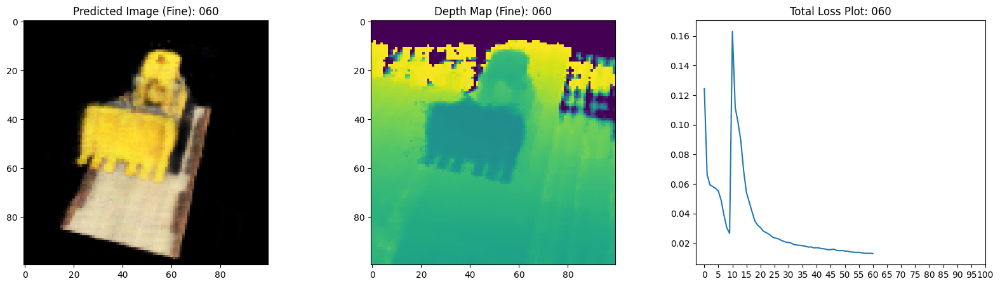

16/16 [==============================] - 12s 726ms/step - total_loss: 0.0131 - coarse_loss: 0.0059 - fine_loss: 0.0048 - coarse_psnr: 22.4032 - fine_psnr: 23.3377 - val_total_loss: 0.0107 - val_coarse_loss: 0.0059 - val_fine_loss: 0.0049 - val_coarse_psnr: 22.3989 - val_fine_psnr: 23.1946
Epoch 62/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0131 - coarse_loss: 0.0060 - fine_loss: 0.0047 - coarse_psnr: 22.3450 - fine_psnr: 23.3532

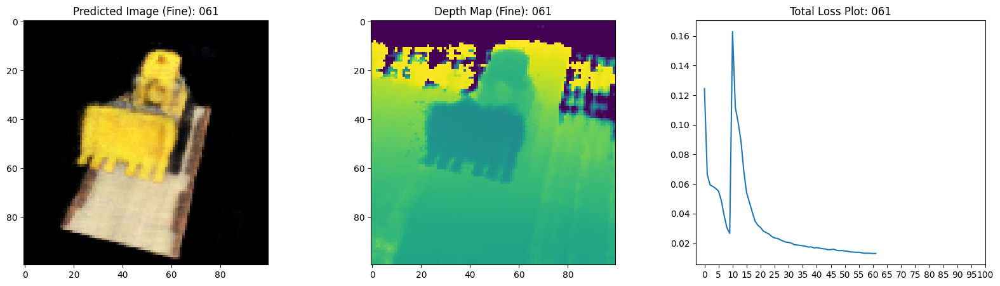

16/16 [==============================] - 12s 726ms/step - total_loss: 0.0131 - coarse_loss: 0.0060 - fine_loss: 0.0047 - coarse_psnr: 22.3450 - fine_psnr: 23.3532 - val_total_loss: 0.0109 - val_coarse_loss: 0.0060 - val_fine_loss: 0.0050 - val_coarse_psnr: 22.3365 - val_fine_psnr: 23.1004
Epoch 63/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0135 - coarse_loss: 0.0063 - fine_loss: 0.0048 - coarse_psnr: 22.1759 - fine_psnr: 23.3093

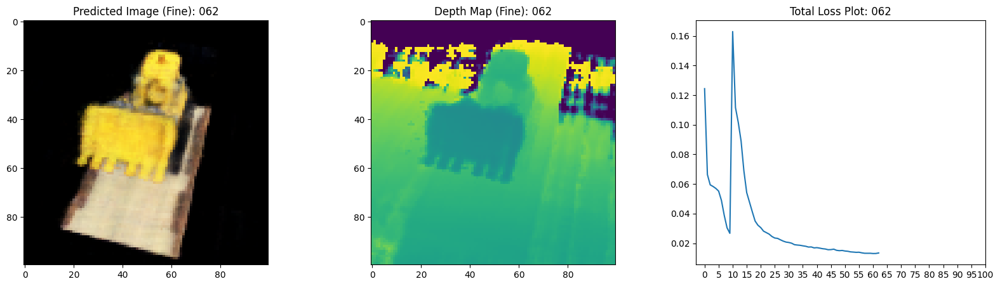

16/16 [==============================] - 12s 728ms/step - total_loss: 0.0135 - coarse_loss: 0.0063 - fine_loss: 0.0048 - coarse_psnr: 22.1759 - fine_psnr: 23.3093 - val_total_loss: 0.0104 - val_coarse_loss: 0.0057 - val_fine_loss: 0.0047 - val_coarse_psnr: 22.5530 - val_fine_psnr: 23.3296
Epoch 64/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0131 - coarse_loss: 0.0061 - fine_loss: 0.0046 - coarse_psnr: 22.2891 - fine_psnr: 23.4767

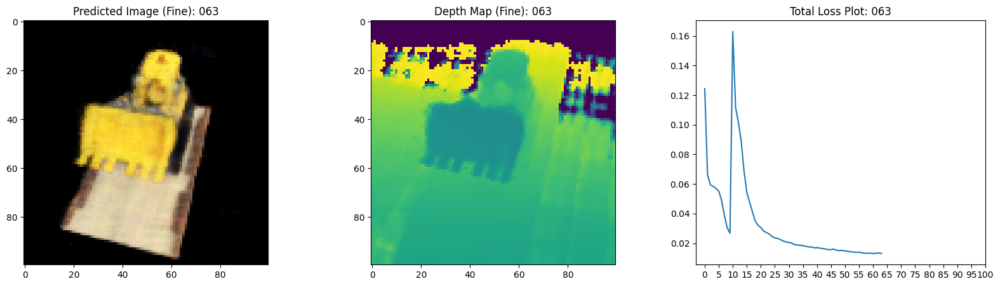

16/16 [==============================] - 12s 726ms/step - total_loss: 0.0131 - coarse_loss: 0.0061 - fine_loss: 0.0046 - coarse_psnr: 22.2891 - fine_psnr: 23.4767 - val_total_loss: 0.0106 - val_coarse_loss: 0.0060 - val_fine_loss: 0.0046 - val_coarse_psnr: 22.3082 - val_fine_psnr: 23.3811
Epoch 65/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0126 - coarse_loss: 0.0059 - fine_loss: 0.0045 - coarse_psnr: 22.4648 - fine_psnr: 23.5863

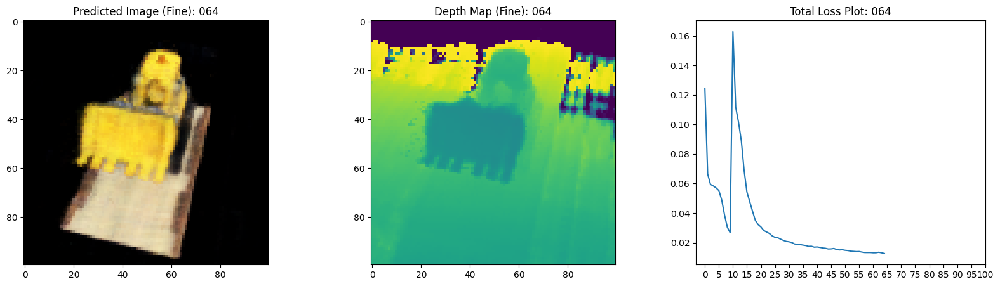

16/16 [==============================] - 12s 726ms/step - total_loss: 0.0126 - coarse_loss: 0.0059 - fine_loss: 0.0045 - coarse_psnr: 22.4648 - fine_psnr: 23.5863 - val_total_loss: 0.0103 - val_coarse_loss: 0.0058 - val_fine_loss: 0.0046 - val_coarse_psnr: 22.5104 - val_fine_psnr: 23.4807
Epoch 66/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0125 - coarse_loss: 0.0058 - fine_loss: 0.0045 - coarse_psnr: 22.4974 - fine_psnr: 23.6169

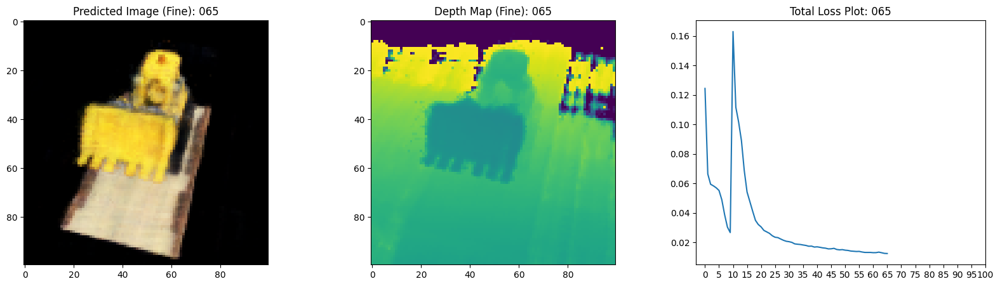

16/16 [==============================] - 12s 725ms/step - total_loss: 0.0125 - coarse_loss: 0.0058 - fine_loss: 0.0045 - coarse_psnr: 22.4974 - fine_psnr: 23.6169 - val_total_loss: 0.0103 - val_coarse_loss: 0.0057 - val_fine_loss: 0.0045 - val_coarse_psnr: 22.5281 - val_fine_psnr: 23.5230
Epoch 67/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0124 - coarse_loss: 0.0058 - fine_loss: 0.0044 - coarse_psnr: 22.5406 - fine_psnr: 23.6717

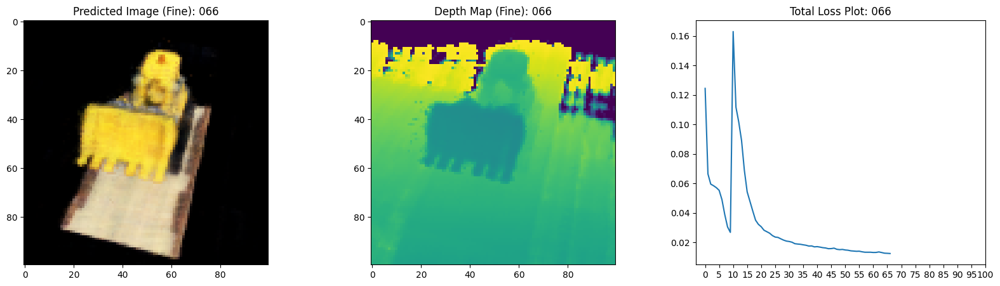

16/16 [==============================] - 12s 725ms/step - total_loss: 0.0124 - coarse_loss: 0.0058 - fine_loss: 0.0044 - coarse_psnr: 22.5406 - fine_psnr: 23.6717 - val_total_loss: 0.0104 - val_coarse_loss: 0.0057 - val_fine_loss: 0.0047 - val_coarse_psnr: 22.5183 - val_fine_psnr: 23.3813
Epoch 68/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0124 - coarse_loss: 0.0058 - fine_loss: 0.0044 - coarse_psnr: 22.5031 - fine_psnr: 23.6339

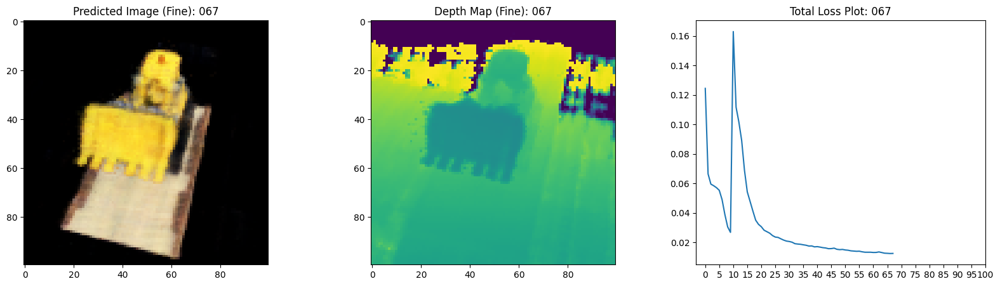

16/16 [==============================] - 12s 743ms/step - total_loss: 0.0124 - coarse_loss: 0.0058 - fine_loss: 0.0044 - coarse_psnr: 22.5031 - fine_psnr: 23.6339 - val_total_loss: 0.0103 - val_coarse_loss: 0.0056 - val_fine_loss: 0.0047 - val_coarse_psnr: 22.6053 - val_fine_psnr: 23.3875
Epoch 69/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0125 - coarse_loss: 0.0058 - fine_loss: 0.0045 - coarse_psnr: 22.4702 - fine_psnr: 23.6070

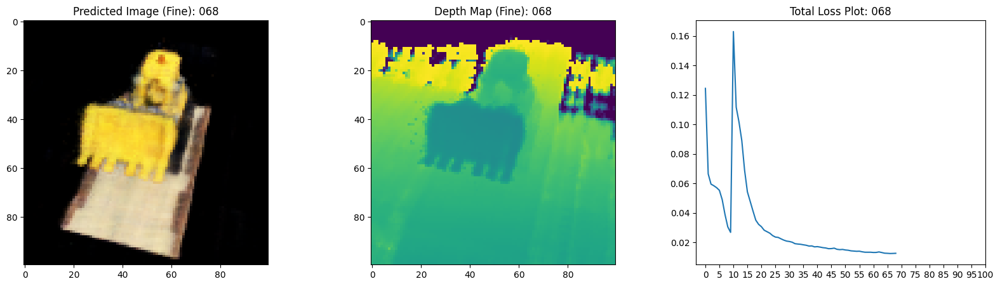

16/16 [==============================] - 12s 725ms/step - total_loss: 0.0125 - coarse_loss: 0.0058 - fine_loss: 0.0045 - coarse_psnr: 22.4702 - fine_psnr: 23.6070 - val_total_loss: 0.0106 - val_coarse_loss: 0.0059 - val_fine_loss: 0.0047 - val_coarse_psnr: 22.3472 - val_fine_psnr: 23.3438
Epoch 70/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0121 - coarse_loss: 0.0057 - fine_loss: 0.0043 - coarse_psnr: 22.6052 - fine_psnr: 23.7673

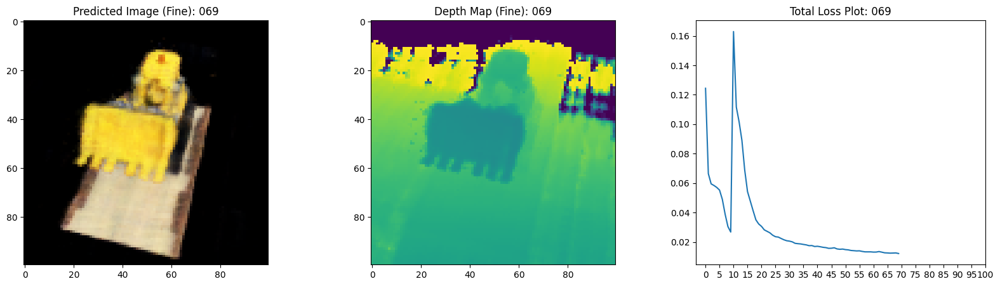

16/16 [==============================] - 12s 726ms/step - total_loss: 0.0121 - coarse_loss: 0.0057 - fine_loss: 0.0043 - coarse_psnr: 22.6052 - fine_psnr: 23.7673 - val_total_loss: 0.0099 - val_coarse_loss: 0.0055 - val_fine_loss: 0.0045 - val_coarse_psnr: 22.7209 - val_fine_psnr: 23.5835
Epoch 71/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0120 - coarse_loss: 0.0056 - fine_loss: 0.0043 - coarse_psnr: 22.6629 - fine_psnr: 23.7927

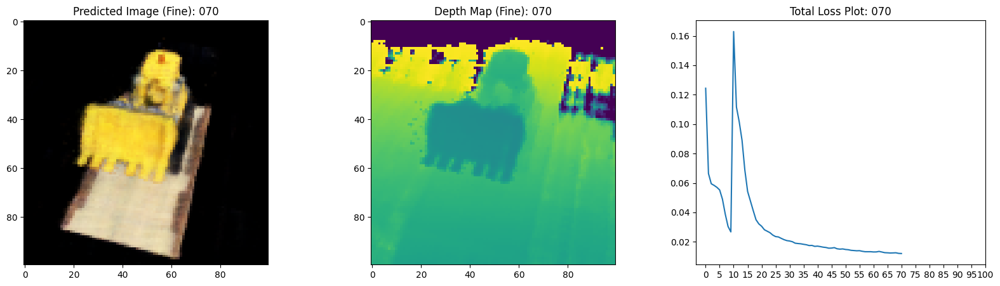

16/16 [==============================] - 12s 727ms/step - total_loss: 0.0120 - coarse_loss: 0.0056 - fine_loss: 0.0043 - coarse_psnr: 22.6629 - fine_psnr: 23.7927 - val_total_loss: 0.0102 - val_coarse_loss: 0.0056 - val_fine_loss: 0.0046 - val_coarse_psnr: 22.5778 - val_fine_psnr: 23.4684
Epoch 72/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0120 - coarse_loss: 0.0057 - fine_loss: 0.0042 - coarse_psnr: 22.6062 - fine_psnr: 23.8788

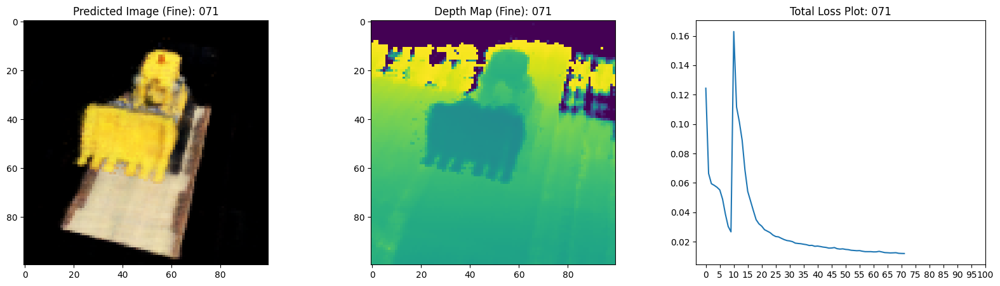

16/16 [==============================] - 12s 726ms/step - total_loss: 0.0120 - coarse_loss: 0.0057 - fine_loss: 0.0042 - coarse_psnr: 22.6062 - fine_psnr: 23.8788 - val_total_loss: 0.0104 - val_coarse_loss: 0.0058 - val_fine_loss: 0.0046 - val_coarse_psnr: 22.4805 - val_fine_psnr: 23.3963
Epoch 73/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0119 - coarse_loss: 0.0055 - fine_loss: 0.0042 - coarse_psnr: 22.6969 - fine_psnr: 23.8834

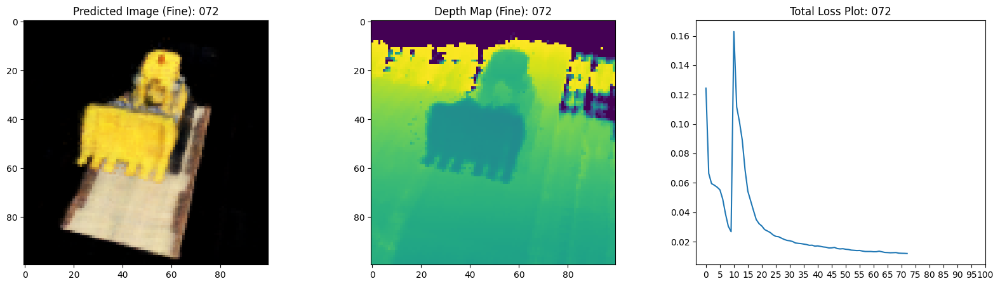

16/16 [==============================] - 12s 726ms/step - total_loss: 0.0119 - coarse_loss: 0.0055 - fine_loss: 0.0042 - coarse_psnr: 22.6969 - fine_psnr: 23.8834 - val_total_loss: 0.0099 - val_coarse_loss: 0.0055 - val_fine_loss: 0.0043 - val_coarse_psnr: 22.6415 - val_fine_psnr: 23.6867
Epoch 74/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0116 - coarse_loss: 0.0055 - fine_loss: 0.0041 - coarse_psnr: 22.7711 - fine_psnr: 24.0094

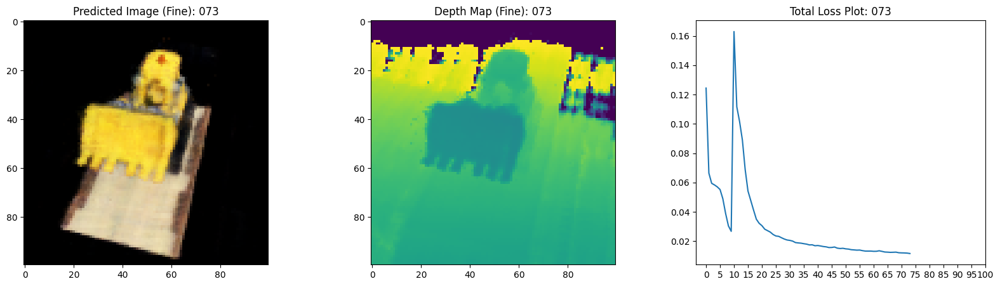

16/16 [==============================] - 12s 726ms/step - total_loss: 0.0116 - coarse_loss: 0.0055 - fine_loss: 0.0041 - coarse_psnr: 22.7711 - fine_psnr: 24.0094 - val_total_loss: 0.0099 - val_coarse_loss: 0.0056 - val_fine_loss: 0.0044 - val_coarse_psnr: 22.6349 - val_fine_psnr: 23.6446
Epoch 75/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0118 - coarse_loss: 0.0055 - fine_loss: 0.0042 - coarse_psnr: 22.7064 - fine_psnr: 23.9240

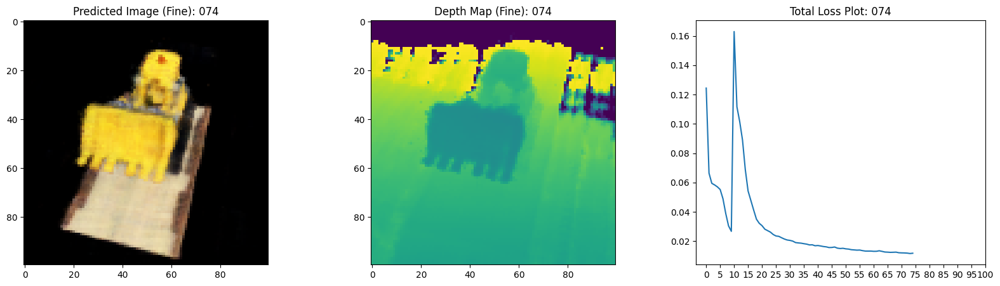

16/16 [==============================] - 12s 726ms/step - total_loss: 0.0118 - coarse_loss: 0.0055 - fine_loss: 0.0042 - coarse_psnr: 22.7064 - fine_psnr: 23.9240 - val_total_loss: 0.0097 - val_coarse_loss: 0.0054 - val_fine_loss: 0.0043 - val_coarse_psnr: 22.7757 - val_fine_psnr: 23.7685
Epoch 76/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0116 - coarse_loss: 0.0054 - fine_loss: 0.0041 - coarse_psnr: 22.8182 - fine_psnr: 23.9519

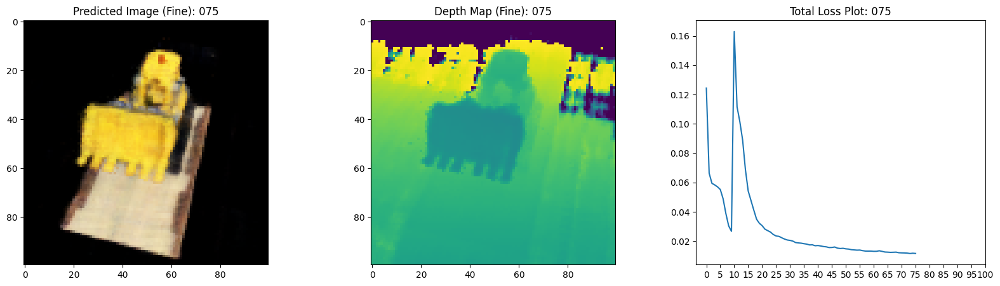

16/16 [==============================] - 12s 726ms/step - total_loss: 0.0116 - coarse_loss: 0.0054 - fine_loss: 0.0041 - coarse_psnr: 22.8182 - fine_psnr: 23.9519 - val_total_loss: 0.0095 - val_coarse_loss: 0.0053 - val_fine_loss: 0.0041 - val_coarse_psnr: 22.8547 - val_fine_psnr: 23.9383
Epoch 77/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0113 - coarse_loss: 0.0053 - fine_loss: 0.0040 - coarse_psnr: 22.9219 - fine_psnr: 24.1161

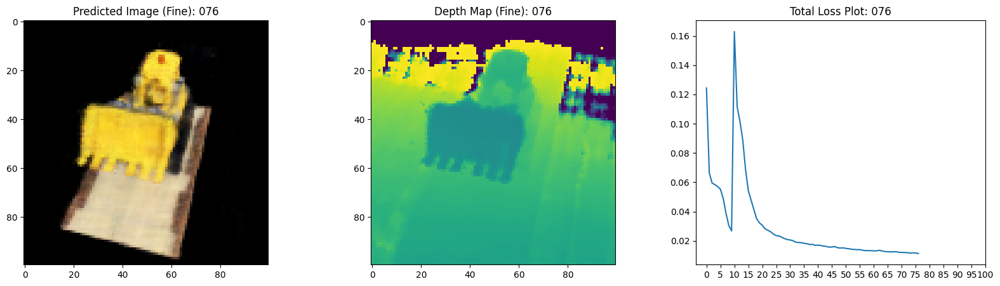

16/16 [==============================] - 12s 744ms/step - total_loss: 0.0113 - coarse_loss: 0.0053 - fine_loss: 0.0040 - coarse_psnr: 22.9219 - fine_psnr: 24.1161 - val_total_loss: 0.0094 - val_coarse_loss: 0.0053 - val_fine_loss: 0.0041 - val_coarse_psnr: 22.8898 - val_fine_psnr: 23.8894
Epoch 78/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0112 - coarse_loss: 0.0052 - fine_loss: 0.0040 - coarse_psnr: 22.9807 - fine_psnr: 24.1339

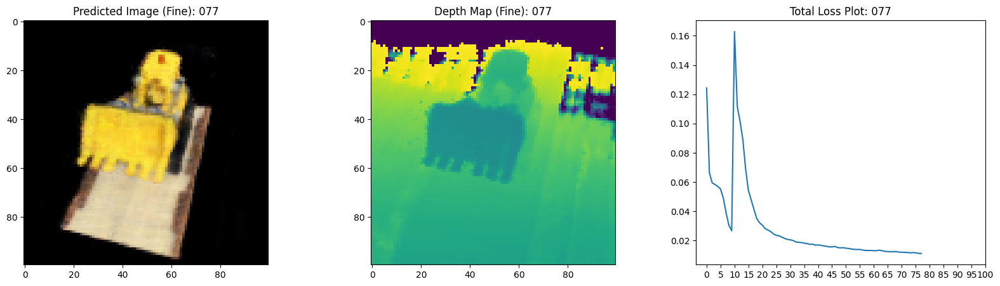

16/16 [==============================] - 12s 726ms/step - total_loss: 0.0112 - coarse_loss: 0.0052 - fine_loss: 0.0040 - coarse_psnr: 22.9807 - fine_psnr: 24.1339 - val_total_loss: 0.0095 - val_coarse_loss: 0.0053 - val_fine_loss: 0.0042 - val_coarse_psnr: 22.9122 - val_fine_psnr: 23.8274
Epoch 79/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0112 - coarse_loss: 0.0052 - fine_loss: 0.0040 - coarse_psnr: 22.9391 - fine_psnr: 24.1349

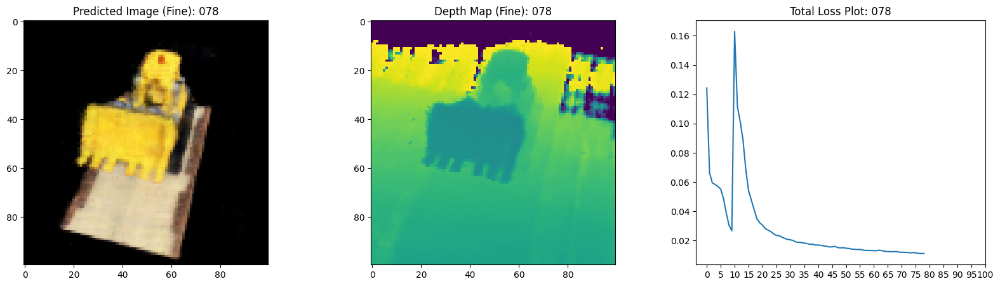

16/16 [==============================] - 12s 726ms/step - total_loss: 0.0112 - coarse_loss: 0.0052 - fine_loss: 0.0040 - coarse_psnr: 22.9391 - fine_psnr: 24.1349 - val_total_loss: 0.0096 - val_coarse_loss: 0.0054 - val_fine_loss: 0.0042 - val_coarse_psnr: 22.8176 - val_fine_psnr: 23.7919
Epoch 80/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0110 - coarse_loss: 0.0052 - fine_loss: 0.0039 - coarse_psnr: 22.9971 - fine_psnr: 24.2666

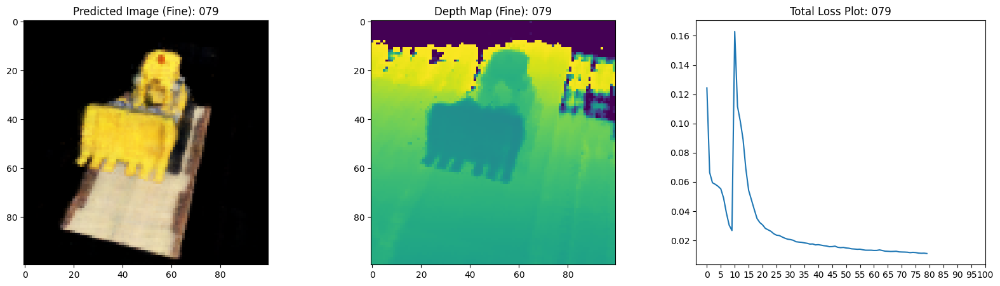

16/16 [==============================] - 12s 725ms/step - total_loss: 0.0110 - coarse_loss: 0.0052 - fine_loss: 0.0039 - coarse_psnr: 22.9971 - fine_psnr: 24.2666 - val_total_loss: 0.0095 - val_coarse_loss: 0.0053 - val_fine_loss: 0.0042 - val_coarse_psnr: 22.8649 - val_fine_psnr: 23.9066
Epoch 81/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0112 - coarse_loss: 0.0053 - fine_loss: 0.0039 - coarse_psnr: 22.8944 - fine_psnr: 24.1615

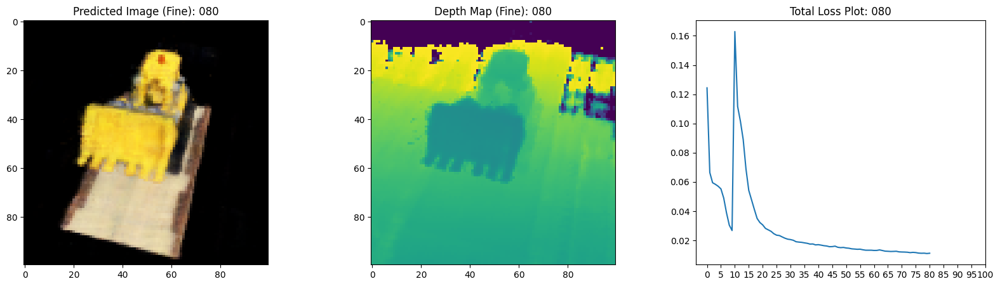

16/16 [==============================] - 12s 726ms/step - total_loss: 0.0112 - coarse_loss: 0.0053 - fine_loss: 0.0039 - coarse_psnr: 22.8944 - fine_psnr: 24.1615 - val_total_loss: 0.0095 - val_coarse_loss: 0.0053 - val_fine_loss: 0.0042 - val_coarse_psnr: 22.8167 - val_fine_psnr: 23.8593
Epoch 82/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0111 - coarse_loss: 0.0052 - fine_loss: 0.0039 - coarse_psnr: 22.9756 - fine_psnr: 24.1798

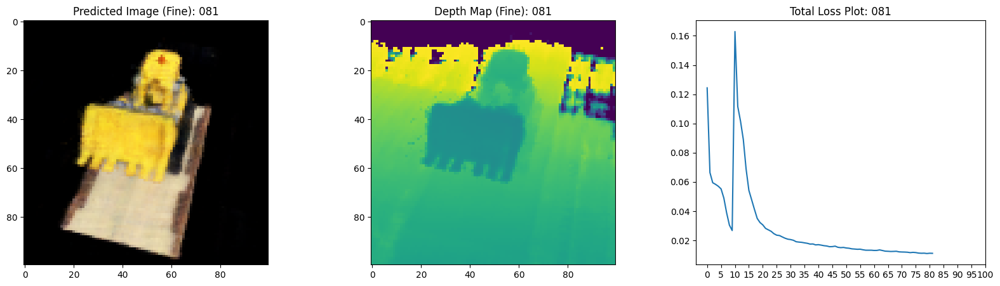

16/16 [==============================] - 11s 725ms/step - total_loss: 0.0111 - coarse_loss: 0.0052 - fine_loss: 0.0039 - coarse_psnr: 22.9756 - fine_psnr: 24.1798 - val_total_loss: 0.0093 - val_coarse_loss: 0.0052 - val_fine_loss: 0.0041 - val_coarse_psnr: 22.9249 - val_fine_psnr: 24.0290
Epoch 83/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0113 - coarse_loss: 0.0052 - fine_loss: 0.0040 - coarse_psnr: 22.9361 - fine_psnr: 24.0701

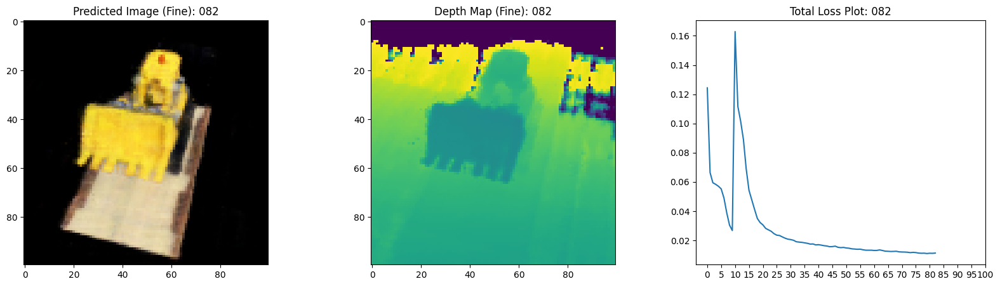

16/16 [==============================] - 12s 725ms/step - total_loss: 0.0113 - coarse_loss: 0.0052 - fine_loss: 0.0040 - coarse_psnr: 22.9361 - fine_psnr: 24.0701 - val_total_loss: 0.0096 - val_coarse_loss: 0.0054 - val_fine_loss: 0.0043 - val_coarse_psnr: 22.7769 - val_fine_psnr: 23.7409
Epoch 84/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0114 - coarse_loss: 0.0053 - fine_loss: 0.0041 - coarse_psnr: 22.9169 - fine_psnr: 24.0036

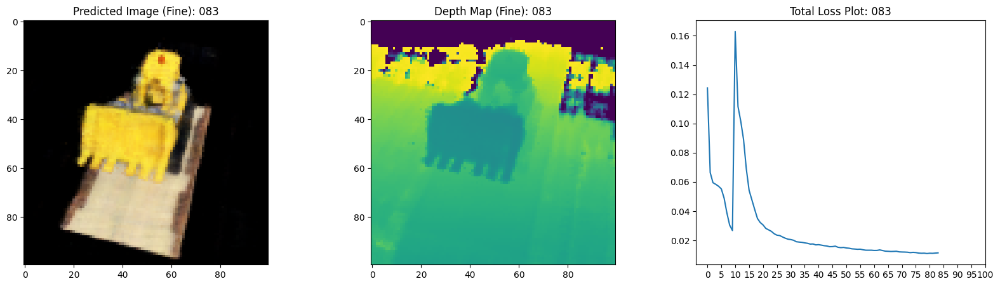

16/16 [==============================] - 12s 725ms/step - total_loss: 0.0114 - coarse_loss: 0.0053 - fine_loss: 0.0041 - coarse_psnr: 22.9169 - fine_psnr: 24.0036 - val_total_loss: 0.0094 - val_coarse_loss: 0.0052 - val_fine_loss: 0.0041 - val_coarse_psnr: 22.9492 - val_fine_psnr: 23.9194
Epoch 85/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0110 - coarse_loss: 0.0051 - fine_loss: 0.0039 - coarse_psnr: 23.0323 - fine_psnr: 24.2327

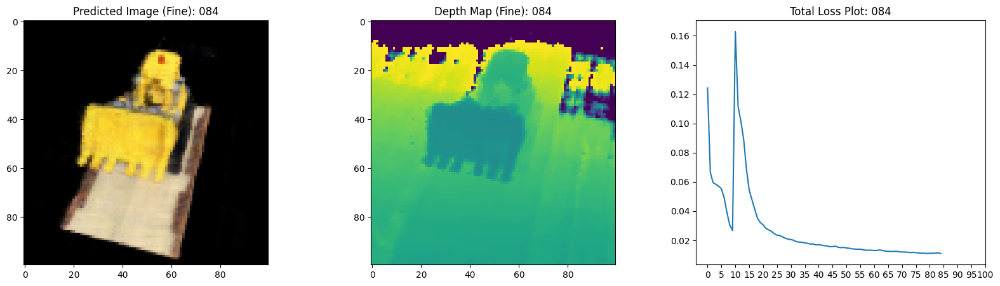

16/16 [==============================] - 12s 726ms/step - total_loss: 0.0110 - coarse_loss: 0.0051 - fine_loss: 0.0039 - coarse_psnr: 23.0323 - fine_psnr: 24.2327 - val_total_loss: 0.0091 - val_coarse_loss: 0.0050 - val_fine_loss: 0.0041 - val_coarse_psnr: 23.0962 - val_fine_psnr: 23.9787
Epoch 86/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0107 - coarse_loss: 0.0050 - fine_loss: 0.0038 - coarse_psnr: 23.1375 - fine_psnr: 24.3388

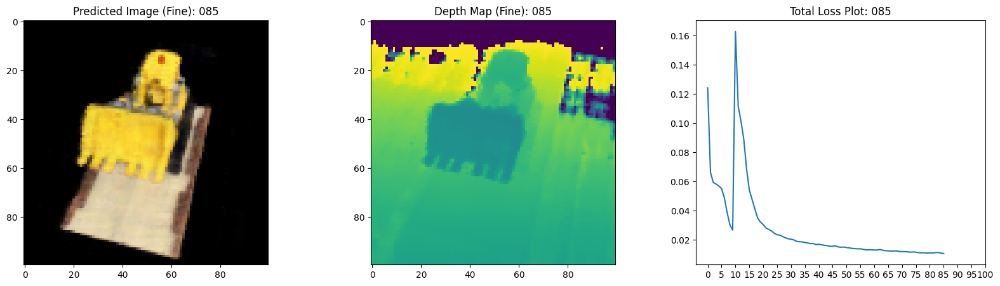

16/16 [==============================] - 12s 726ms/step - total_loss: 0.0107 - coarse_loss: 0.0050 - fine_loss: 0.0038 - coarse_psnr: 23.1375 - fine_psnr: 24.3388 - val_total_loss: 0.0091 - val_coarse_loss: 0.0051 - val_fine_loss: 0.0040 - val_coarse_psnr: 23.0829 - val_fine_psnr: 24.0479
Epoch 87/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0108 - coarse_loss: 0.0051 - fine_loss: 0.0038 - coarse_psnr: 23.0450 - fine_psnr: 24.3514

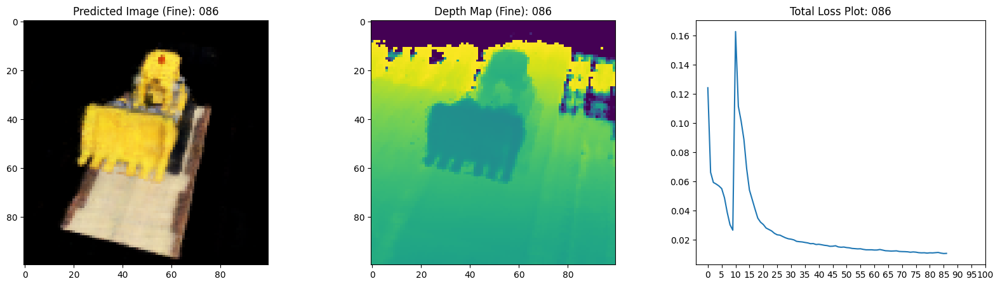

16/16 [==============================] - 12s 745ms/step - total_loss: 0.0108 - coarse_loss: 0.0051 - fine_loss: 0.0038 - coarse_psnr: 23.0450 - fine_psnr: 24.3514 - val_total_loss: 0.0092 - val_coarse_loss: 0.0053 - val_fine_loss: 0.0039 - val_coarse_psnr: 22.9346 - val_fine_psnr: 24.1723
Epoch 88/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0106 - coarse_loss: 0.0051 - fine_loss: 0.0037 - coarse_psnr: 23.0468 - fine_psnr: 24.5145

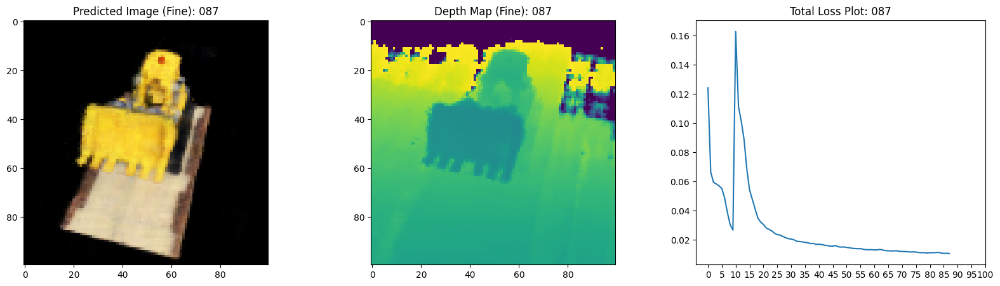

16/16 [==============================] - 12s 726ms/step - total_loss: 0.0106 - coarse_loss: 0.0051 - fine_loss: 0.0037 - coarse_psnr: 23.0468 - fine_psnr: 24.5145 - val_total_loss: 0.0086 - val_coarse_loss: 0.0048 - val_fine_loss: 0.0037 - val_coarse_psnr: 23.2745 - val_fine_psnr: 24.4056
Epoch 89/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0104 - coarse_loss: 0.0049 - fine_loss: 0.0036 - coarse_psnr: 23.1892 - fine_psnr: 24.5477

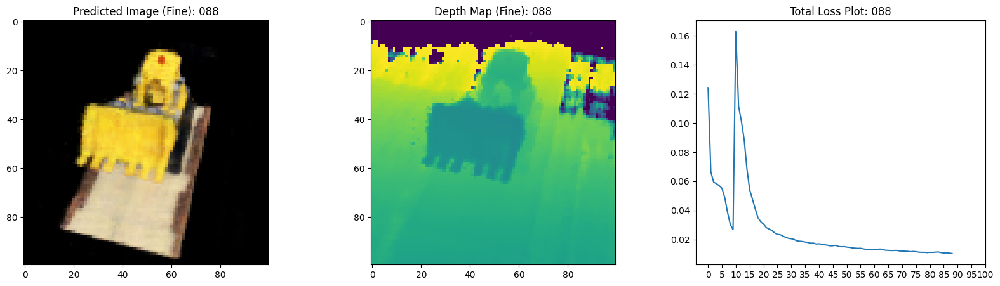

16/16 [==============================] - 12s 726ms/step - total_loss: 0.0104 - coarse_loss: 0.0049 - fine_loss: 0.0036 - coarse_psnr: 23.1892 - fine_psnr: 24.5477 - val_total_loss: 0.0087 - val_coarse_loss: 0.0049 - val_fine_loss: 0.0038 - val_coarse_psnr: 23.2184 - val_fine_psnr: 24.2430
Epoch 90/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0106 - coarse_loss: 0.0049 - fine_loss: 0.0037 - coarse_psnr: 23.1901 - fine_psnr: 24.3943

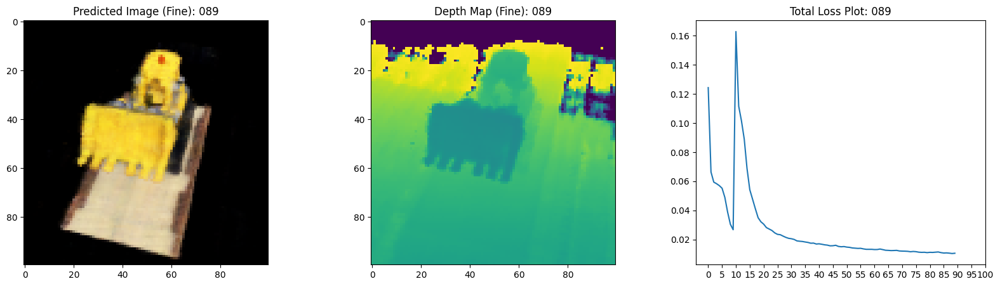

16/16 [==============================] - 12s 726ms/step - total_loss: 0.0106 - coarse_loss: 0.0049 - fine_loss: 0.0037 - coarse_psnr: 23.1901 - fine_psnr: 24.3943 - val_total_loss: 0.0088 - val_coarse_loss: 0.0049 - val_fine_loss: 0.0038 - val_coarse_psnr: 23.1647 - val_fine_psnr: 24.2574
Epoch 91/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0108 - coarse_loss: 0.0050 - fine_loss: 0.0039 - coarse_psnr: 23.1660 - fine_psnr: 24.2912

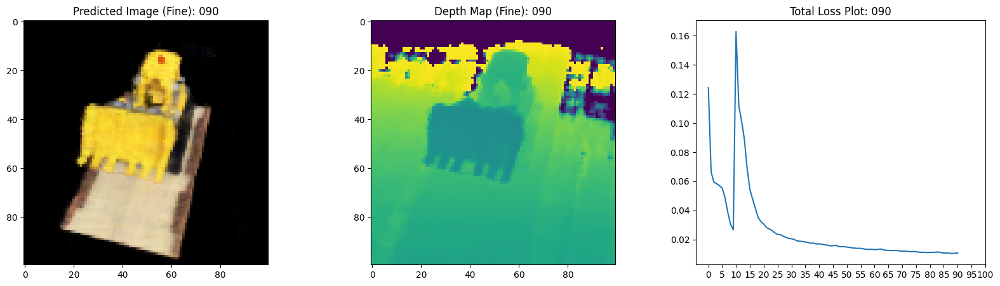

16/16 [==============================] - 12s 726ms/step - total_loss: 0.0108 - coarse_loss: 0.0050 - fine_loss: 0.0039 - coarse_psnr: 23.1660 - fine_psnr: 24.2912 - val_total_loss: 0.0088 - val_coarse_loss: 0.0049 - val_fine_loss: 0.0039 - val_coarse_psnr: 23.2071 - val_fine_psnr: 24.1190
Epoch 92/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0109 - coarse_loss: 0.0050 - fine_loss: 0.0039 - coarse_psnr: 23.1092 - fine_psnr: 24.2333

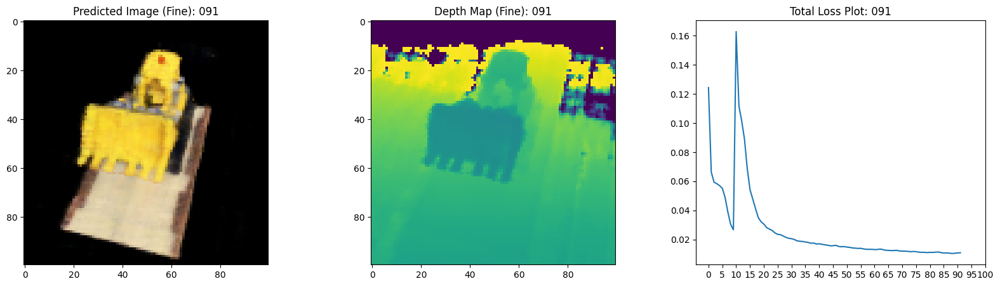

16/16 [==============================] - 12s 726ms/step - total_loss: 0.0109 - coarse_loss: 0.0050 - fine_loss: 0.0039 - coarse_psnr: 23.1092 - fine_psnr: 24.2333 - val_total_loss: 0.0090 - val_coarse_loss: 0.0050 - val_fine_loss: 0.0040 - val_coarse_psnr: 23.0936 - val_fine_psnr: 24.0279
Epoch 93/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0105 - coarse_loss: 0.0049 - fine_loss: 0.0037 - coarse_psnr: 23.2044 - fine_psnr: 24.4393

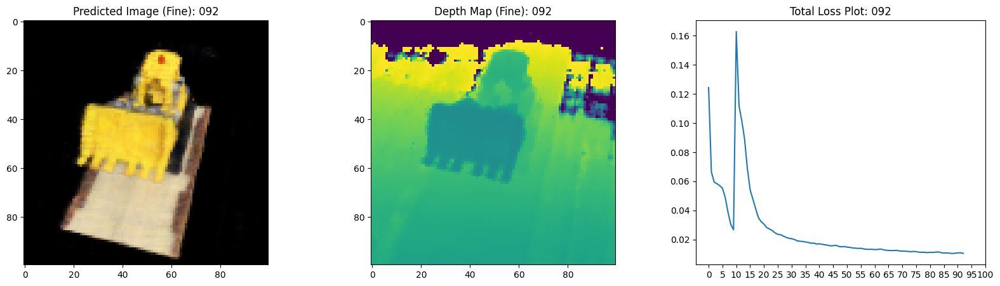

16/16 [==============================] - 12s 726ms/step - total_loss: 0.0105 - coarse_loss: 0.0049 - fine_loss: 0.0037 - coarse_psnr: 23.2044 - fine_psnr: 24.4393 - val_total_loss: 0.0089 - val_coarse_loss: 0.0050 - val_fine_loss: 0.0039 - val_coarse_psnr: 23.1461 - val_fine_psnr: 24.1643
Epoch 94/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0104 - coarse_loss: 0.0050 - fine_loss: 0.0036 - coarse_psnr: 23.1695 - fine_psnr: 24.5065

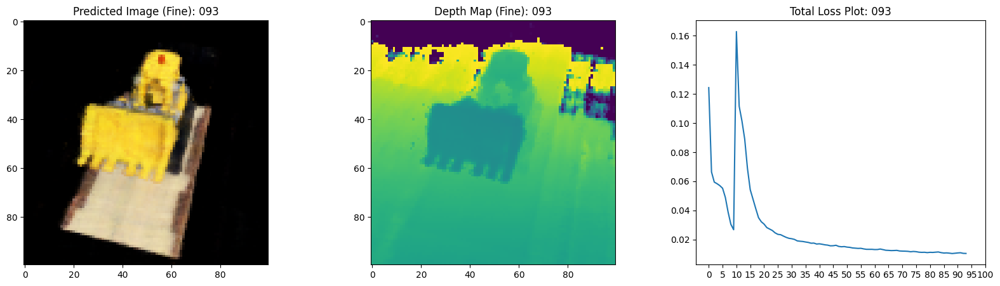

16/16 [==============================] - 12s 726ms/step - total_loss: 0.0104 - coarse_loss: 0.0050 - fine_loss: 0.0036 - coarse_psnr: 23.1695 - fine_psnr: 24.5065 - val_total_loss: 0.0091 - val_coarse_loss: 0.0050 - val_fine_loss: 0.0041 - val_coarse_psnr: 23.0466 - val_fine_psnr: 23.9919
Epoch 95/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0105 - coarse_loss: 0.0050 - fine_loss: 0.0036 - coarse_psnr: 23.1248 - fine_psnr: 24.5166

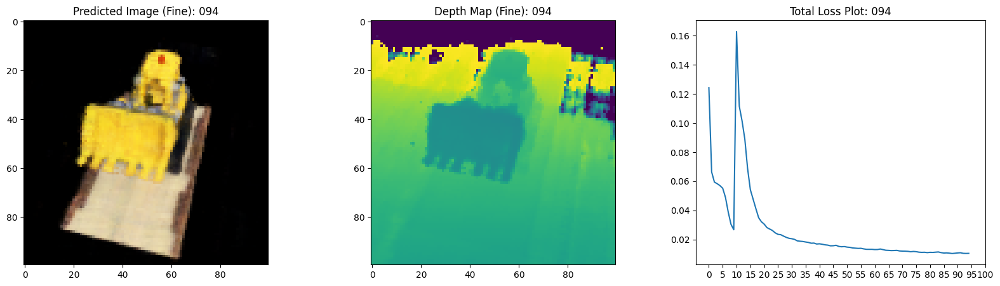

16/16 [==============================] - 12s 726ms/step - total_loss: 0.0105 - coarse_loss: 0.0050 - fine_loss: 0.0036 - coarse_psnr: 23.1248 - fine_psnr: 24.5166 - val_total_loss: 0.0087 - val_coarse_loss: 0.0048 - val_fine_loss: 0.0039 - val_coarse_psnr: 23.2890 - val_fine_psnr: 24.2383
Epoch 96/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0101 - coarse_loss: 0.0048 - fine_loss: 0.0036 - coarse_psnr: 23.3539 - fine_psnr: 24.6051

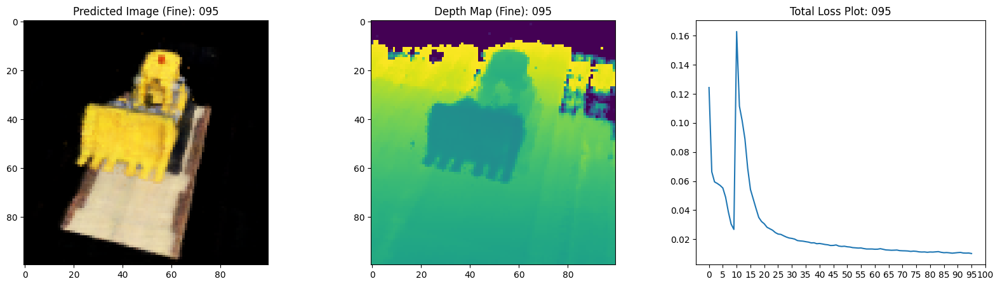

16/16 [==============================] - 12s 726ms/step - total_loss: 0.0101 - coarse_loss: 0.0048 - fine_loss: 0.0036 - coarse_psnr: 23.3539 - fine_psnr: 24.6051 - val_total_loss: 0.0089 - val_coarse_loss: 0.0049 - val_fine_loss: 0.0040 - val_coarse_psnr: 23.2539 - val_fine_psnr: 24.0928
Epoch 97/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0102 - coarse_loss: 0.0047 - fine_loss: 0.0036 - coarse_psnr: 23.3762 - fine_psnr: 24.5192

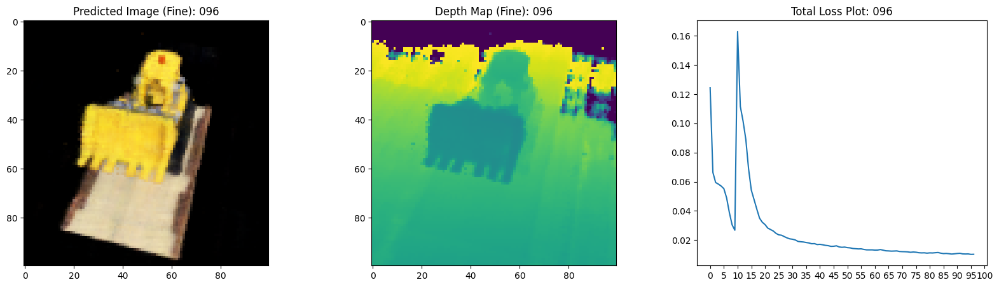

16/16 [==============================] - 12s 743ms/step - total_loss: 0.0102 - coarse_loss: 0.0047 - fine_loss: 0.0036 - coarse_psnr: 23.3762 - fine_psnr: 24.5192 - val_total_loss: 0.0087 - val_coarse_loss: 0.0048 - val_fine_loss: 0.0039 - val_coarse_psnr: 23.3430 - val_fine_psnr: 24.1842
Epoch 98/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0103 - coarse_loss: 0.0048 - fine_loss: 0.0037 - coarse_psnr: 23.3135 - fine_psnr: 24.4694

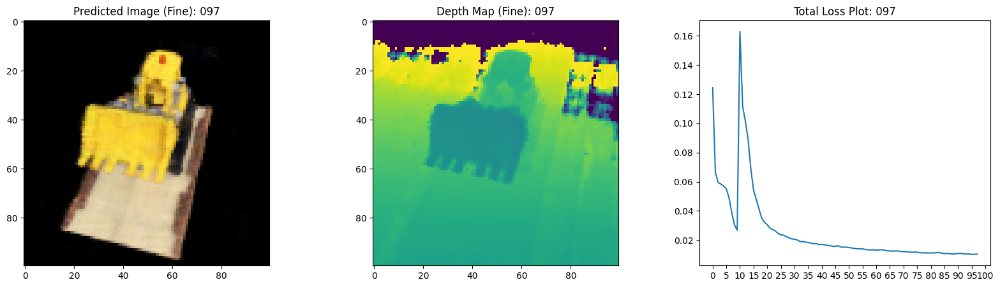

16/16 [==============================] - 12s 727ms/step - total_loss: 0.0103 - coarse_loss: 0.0048 - fine_loss: 0.0037 - coarse_psnr: 23.3135 - fine_psnr: 24.4694 - val_total_loss: 0.0083 - val_coarse_loss: 0.0046 - val_fine_loss: 0.0038 - val_coarse_psnr: 23.5411 - val_fine_psnr: 24.3078
Epoch 99/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0099 - coarse_loss: 0.0046 - fine_loss: 0.0035 - coarse_psnr: 23.4950 - fine_psnr: 24.6554

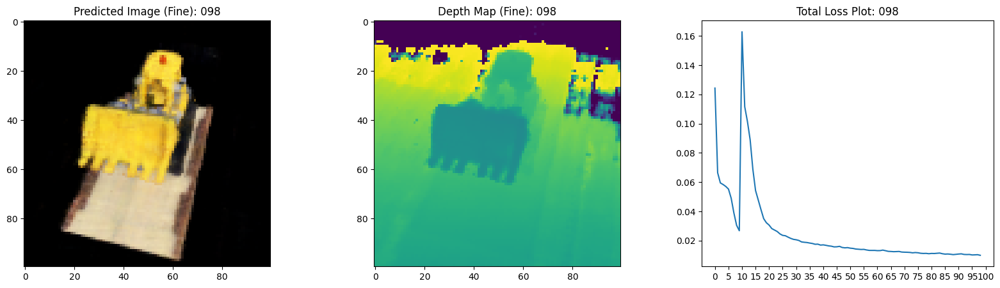

16/16 [==============================] - 12s 726ms/step - total_loss: 0.0099 - coarse_loss: 0.0046 - fine_loss: 0.0035 - coarse_psnr: 23.4950 - fine_psnr: 24.6554 - val_total_loss: 0.0084 - val_coarse_loss: 0.0047 - val_fine_loss: 0.0037 - val_coarse_psnr: 23.3810 - val_fine_psnr: 24.3501
Epoch 100/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0098 - coarse_loss: 0.0046 - fine_loss: 0.0035 - coarse_psnr: 23.5121 - fine_psnr: 24.7438

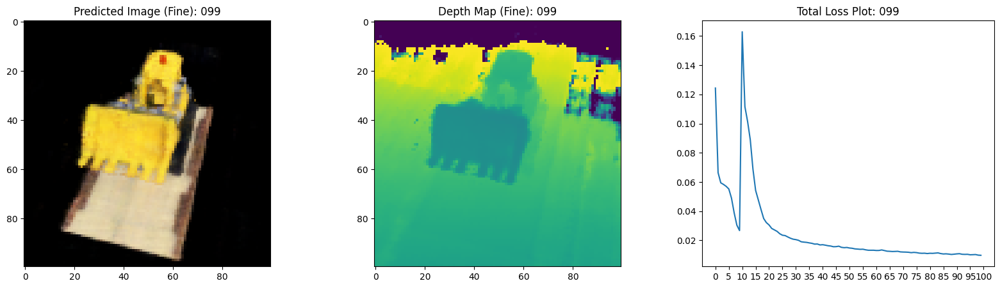

16/16 [==============================] - 12s 725ms/step - total_loss: 0.0098 - coarse_loss: 0.0046 - fine_loss: 0.0035 - coarse_psnr: 23.5121 - fine_psnr: 24.7438 - val_total_loss: 0.0083 - val_coarse_loss: 0.0046 - val_fine_loss: 0.0038 - val_coarse_psnr: 23.5085 - val_fine_psnr: 24.3553


100%|██████████| 100/100 [00:01<00:00, 84.18it/s]


In [6]:
class EpochUpdaterCallback(keras.callbacks.Callback):
    def on_epoch_begin(self, epoch, logs=None):
        self.model.current_epoch.assign(epoch)
        
class NeRF(keras.Model):
    def __init__(self, nerf_model_coarse, nerf_model_fine, warmup_epochs=0):
        super().__init__()
        self.nerf_model_coarse = nerf_model_coarse
        self.nerf_model_fine = nerf_model_fine
        self.warmup_epochs = warmup_epochs
        self.current_epoch = tf.Variable(0, trainable=False, dtype=tf.int64)

    def compile(self, optimizer_coarse, optimizer_fine, loss_fn):
        super().compile()
        self.optimizer_coarse = optimizer_coarse
        self.optimizer_fine = optimizer_fine
        self.loss_fn = loss_fn

        self.total_loss_tracker = keras.metrics.Mean(name="total_loss")
        self.coarse_loss_tracker = keras.metrics.Mean(name="coarse_loss")
        self.fine_loss_tracker = keras.metrics.Mean(name="fine_loss")
        self.coarse_psnr_metric = keras.metrics.Mean(name="coarse_psnr")
        self.fine_psnr_metric = keras.metrics.Mean(name="fine_psnr")

    def train_step(self, inputs):
        images, (ray_origins, ray_directions) = inputs

        with tf.GradientTape(persistent=True) as tape:
            # --- Coarse 패스 (항상) ---
            rgb_fine, _, extras = render_rays_hierarchical(
                model_coarse = self.nerf_model_coarse,
                model_fine   = self.nerf_model_fine,
                ray_origins  = ray_origins,
                ray_directions = ray_directions,
                near=2.0, far=6.0,
                perturb_coarse=True,
                train=True
            )
            rgb_coarse = extras["rgb_coarse"]

            loss_coarse = self.loss_fn(images, rgb_coarse)

            # --- Warmup 마스크를 Tensor 연산으로 생성 ---
            # current_epoch < warmup_epochs 이면 1.0, 아니면 0.0
            warmup_mask = tf.cast(
                tf.less(self.current_epoch, self.warmup_epochs),
                tf.float32
            )
            # loss_fine 은 warmup 기간엔 0, 이후엔 실제 fine loss
            loss_fine = self.loss_fn(images, rgb_fine) * (1.0 - warmup_mask)

            # total_loss = loss_coarse + loss_fine
            total_loss  = loss_coarse + 1.5 * loss_fine

        # Coarse 모델 업데이트
        grads_coarse = tape.gradient(total_loss, self.nerf_model_coarse.trainable_variables)
        self.optimizer_coarse.apply_gradients(zip(grads_coarse, self.nerf_model_coarse.trainable_variables))

        # Fine 모델 업데이트 (warmup 기간엔 loss_fine==0 이므로 gradient도 0)
        grads_fine = tape.gradient(total_loss, self.nerf_model_fine.trainable_variables)
        self.optimizer_fine.apply_gradients(zip(grads_fine, self.nerf_model_fine.trainable_variables))

        del tape

        # PSNR 계산
        psnr_coarse_val = tf.image.psnr(images, rgb_coarse, max_val=1.0)
        psnr_fine_val   = tf.image.psnr(images, rgb_fine,   max_val=1.0)

        # Metric 업데이트
        self.total_loss_tracker.update_state(total_loss)
        self.coarse_loss_tracker.update_state(loss_coarse)
        # warmup_mask이 1일 때는 loss_fine*0 → metric에 0 저장
        self.fine_loss_tracker.update_state(loss_fine)
        self.coarse_psnr_metric.update_state(psnr_coarse_val)
        self.fine_psnr_metric.update_state(psnr_fine_val)

        return {m.name: m.result() for m in self.metrics}

    def test_step(self, inputs):
        (images, rays_od) = inputs
        ray_origins, ray_directions = rays_od

        rgb_fine, _, extras = render_rays_hierarchical(
            model_coarse=self.nerf_model_coarse,
            model_fine=self.nerf_model_fine,
            ray_origins=ray_origins,
            ray_directions=ray_directions,
            near=2.0,
            far=6.0,
            perturb_coarse=False,
            train=False
        )
        rgb_coarse = extras["rgb_coarse"]

        loss_coarse = self.loss_fn(images, rgb_coarse)
        loss_fine = self.loss_fn(images, rgb_fine)
        total_loss = loss_coarse + loss_fine

        psnr_coarse_val = tf.image.psnr(images, rgb_coarse, max_val=1.0)
        psnr_fine_val = tf.image.psnr(images, rgb_fine, max_val=1.0)

        self.total_loss_tracker.update_state(total_loss)
        self.coarse_loss_tracker.update_state(loss_coarse)
        self.fine_loss_tracker.update_state(loss_fine)
        self.coarse_psnr_metric.update_state(psnr_coarse_val)
        self.fine_psnr_metric.update_state(psnr_fine_val)

        return {m.name: m.result() for m in self.metrics}

    @property
    def metrics(self):
        return [
            self.total_loss_tracker,
            self.coarse_loss_tracker,
            self.fine_loss_tracker,
            self.coarse_psnr_metric,
            self.fine_psnr_metric
        ]
monitor_data_iter = iter(val_ds) # 검증 데이터셋 사용 권장, 없으면 train_ds
monitor_images_batch, (monitor_ray_origins_batch, monitor_ray_directions_batch) = next(monitor_data_iter)
del monitor_data_iter

loss_list = [] # TrainMonitor에서 사용

class TrainMonitor(keras.callbacks.Callback):
    def __init__(self, images_batch, ray_origins_batch, ray_directions_batch, near=2.0, far=6.0):
        super().__init__()
        self.images_batch = images_batch
        self.ray_origins_batch = ray_origins_batch
        self.ray_directions_batch = ray_directions_batch
        self.near = near
        self.far = far


    def on_epoch_end(self, epoch, logs=None):
        # logs에는 total_loss, coarse_loss, fine_loss, coarse_psnr, fine_psnr 등이 포함됨
        # current_loss = logs.get("loss", None) # NeRF 모델의 'loss' metric (total_loss)
        current_loss = logs.get("total_loss", None)
        if current_loss is not None:
            loss_list.append(current_loss)
        
        # 저장된 배치 데이터를 사용하여 이미지 생성
        recons_images_fine, depth_maps_fine, extras = render_rays_hierarchical(
            model_coarse=self.model.nerf_model_coarse, # 콜백 내에서는 self.model로 접근
            model_fine=self.model.nerf_model_fine,
            ray_origins=self.ray_origins_batch,
            ray_directions=self.ray_directions_batch,
            near=self.near, 
            far=self.far,
            perturb_coarse=False, # 시각화 시에는 deterministic
            train=False, # predict 모드
        )
        
        # Plot the rgb (fine), depth (fine) and the loss plot.
        fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(20, 5))
        ax[0].imshow(tf.keras.utils.array_to_img(recons_images_fine[0])) # 배치의 첫 번째 이미지
        ax[0].set_title(f"Predicted Image (Fine): {epoch:03d}")

        ax[1].imshow(tf.keras.utils.array_to_img(depth_maps_fine[0, ..., None]))
        ax[1].set_title(f"Depth Map (Fine): {epoch:03d}")

        if loss_list: # loss_list가 비어있지 않을 때만 plot
            ax[2].plot(loss_list)
            ax[2].set_xticks(np.arange(0, EPOCHS + 1, 5.0 if EPOCHS >=5 else 1.0))
            ax[2].set_title(f"Total Loss Plot: {epoch:03d}")

        fig.savefig(f"images/{epoch:03d}.png")
        plt.show() # 노트북에서 너무 많은 창이 뜨는 것을 방지하려면 주석 처리 권장
        plt.close(fig)


# 모델 생성
# SINGLE_COORD_ENCODED_DIMS는 이전 셀에서 정의된 전역 변수
nerf_model_coarse = get_nerf_model_modified(num_layers=8, encoded_dims_per_coord=SINGLE_COORD_ENCODED_DIMS)
nerf_model_fine = get_nerf_model_modified(num_layers=8, encoded_dims_per_coord=SINGLE_COORD_ENCODED_DIMS) # 동일 구조 사용

# model = NeRF(nerf_model_coarse, nerf_model_fine)
model = NeRF(nerf_model_coarse, nerf_model_fine, warmup_epochs=WARMUP_EPOCHS)


# 옵티마이저 생성 (Coarse와 Fine에 대해 별도 또는 공유 가능)
# 여기서는 학습률이 동일한 별도의 옵티마이저 사용
optimizer_coarse = tf.keras.optimizers.Adam(learning_rate=0.001) # 원본 NeRF 학습률 참고
optimizer_fine = tf.keras.optimizers.Adam(learning_rate=0.002)

model.compile(
    optimizer_coarse=optimizer_coarse,
    optimizer_fine=optimizer_fine,
    loss_fn=keras.losses.MeanSquaredError()
)

# 이미지 저장 디렉토리 생성
if not os.path.exists("images"):
    os.makedirs("images")

# TrainMonitor 인스턴스 생성 시 준비된 데이터 전달
train_monitor_callback = TrainMonitor(
    images_batch=monitor_images_batch,
    ray_origins_batch=monitor_ray_origins_batch,
    ray_directions_batch=monitor_ray_directions_batch
)

# 모델 학습
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS,
    callbacks=[
        train_monitor_callback, # 기존 콜백 유지
        EpochUpdaterCallback()  # 새로 정의한 콜백 추가
    ],
)

def create_gif(path_to_images, name_gif):
    filenames = glob.glob(path_to_images)
    filenames = sorted(filenames)
    if not filenames:
        print(f"No images found at {path_to_images} to create a GIF.")
        return
    images_for_gif = []
    for filename in tqdm(filenames):
        images_for_gif.append(imageio.imread(filename))
    kargs = {"duration": 0.25, "loop": 0} # loop=0 for infinite loop
    imageio.mimsave(name_gif, images_for_gif, "GIF", **kargs)

create_gif("images/*.png", "training_hierarchical.gif") # GIF 이름 변경

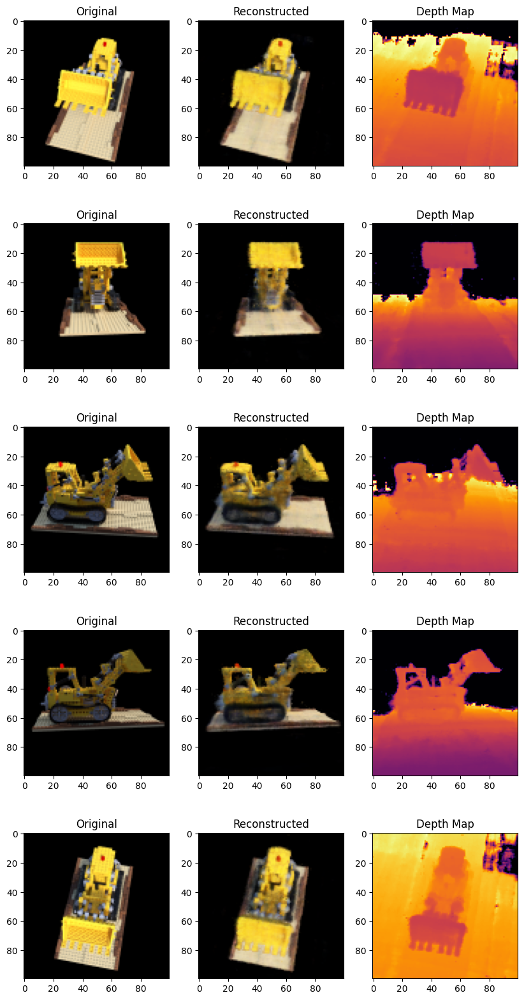

In [7]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from keras import utils

orig_images = monitor_images_batch

recons_images_fine, depth_maps_fine, _ = render_rays_hierarchical(
    model_coarse   = model.nerf_model_coarse,
    model_fine     = model.nerf_model_fine,
    ray_origins    = monitor_ray_origins_batch,
    ray_directions = monitor_ray_directions_batch,
    near           = 2.0,
    far            = 6.0,
    perturb_coarse = False,
    train          = False,
)

# Create subplots.
fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(10, 20))

for ax, ori_img, recons_img, depth_map in zip(
    axes, orig_images, recons_images_fine, depth_maps_fine
):
    ax[0].imshow(keras.utils.array_to_img(ori_img))
    ax[0].set_title("Original")

    ax[1].imshow(keras.utils.array_to_img(recons_img))
    ax[1].set_title("Reconstructed")

    ax[2].imshow(keras.utils.array_to_img(depth_map[..., None]), cmap="inferno")
    ax[2].set_title("Depth Map")


In [8]:

# import sys
# !{sys.executable} -m pip install imageio[ffmpeg]


In [9]:
import numpy as np
import tensorflow as tf
from tqdm import tqdm
import imageio

# --- Define camera pose helpers ---
def get_translation_t(t):
    """Get the translation matrix for movement in t."""
    matrix = [
        [1, 0, 0, 0],
        [0, 1, 0, 0],
        [0, 0, 1, t],
        [0, 0, 0, 1],
    ]
    return tf.convert_to_tensor(matrix, dtype=tf.float32)
 
def get_rotation_phi(phi):
    """Get the rotation matrix for movement in phi."""
    matrix = [
        [1, 0, 0, 0],
        [0, tf.cos(phi), -tf.sin(phi), 0],
        [0, tf.sin(phi),  tf.cos(phi), 0],
        [0, 0, 0, 1],
    ]
    return tf.convert_to_tensor(matrix, dtype=tf.float32)

def get_rotation_theta(theta):
    """Get the rotation matrix for movement in theta."""
    matrix = [
        [ tf.cos(theta), 0, -tf.sin(theta), 0],
        [ 0,             1,  0,             0],
        [ tf.sin(theta), 0,  tf.cos(theta), 0],
        [ 0,             0,  0,             1],
    ]
    return tf.convert_to_tensor(matrix, dtype=tf.float32)

def pose_spherical(theta, phi, t):
    """Build camera-to-world matrix from spherical angles (degrees) and radius t."""
    c2w = get_translation_t(t)
    c2w = get_rotation_phi(phi / 180.0 * np.pi) @ c2w
    c2w = get_rotation_theta(theta / 180.0 * np.pi) @ c2w
    # flip from OpenGL to our coords
    flip = np.array([[-1,0,0,0],[0,0,1,0],[0,1,0,0],[0,0,0,1]], dtype=np.float32)
    return flip @ c2w


In [10]:

# … pose_spherical, get_rays, render_rays_hierarchical, model setup …

nerf_coarse = model.nerf_model_coarse
nerf_fine   = model.nerf_model_fine

rgb_frames = []
depth_frames = []
thetas = np.linspace(0.0, 360.0, 120, endpoint=False)

for theta in tqdm(thetas, desc="Rendering frames"):
    # 1) camera‐to‐world
    c2w = pose_spherical(theta, -30.0, 4.0)

    # 2) unbatched rays of shape (H, W, 3)
    ray_origins, ray_directions = get_rays(H, W, focal, c2w)

    # 3) add batch dim → (1, H, W, 3)
    ray_origins   = ray_origins[None, ...]
    ray_directions= ray_directions[None, ...]

    # 4) render returns tensors of shape (1, H, W, 3) and (1, H, W)
    rgb_pred, depth_pred, _ = render_rays_hierarchical(
        model_coarse   = nerf_coarse,
        model_fine     = nerf_fine,
        ray_origins    = ray_origins,
        ray_directions = ray_directions,
        near           = 2.0,
        far            = 6.0,
        perturb_coarse = False,
        train          = False,
    )

    # 5) drop the batch dim
    rgb   = rgb_pred[0]   # shape (H, W, 3)
    depth = depth_pred[0] # shape (H, W)

    # 6) to uint8 images
    rgb_np   = (rgb.numpy()   * 255).astype(np.uint8)
    depth_np = (depth.numpy() * 255).astype(np.uint8)

    rgb_frames.append(rgb_np)
    depth_frames.append(depth_np)

# 7) write out
imageio.mimwrite("rgb_video.mp4",   rgb_frames,   fps=30)
imageio.mimwrite("depth_video.mp4", depth_frames, fps=30)

print("Saved: rgb_video.mp4 and depth_video.mp4")


Rendering frames: 100%|██████████| 120/120 [00:10<00:00, 11.54it/s]
IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (100, 100) to (112, 112) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).
[swscaler @ 0x14b5bf80] Warning: data is not aligned! This can lead to a speed loss
IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (100, 100) to (112, 112) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).
[swscaler @ 0x1d137c00] Warning: data is not aligned! This can lead to a speed loss


Saved: rgb_video.mp4 and depth_video.mp4
